<a href="https://colab.research.google.com/github/naenumtou/ifrs9/blob/main/LGD/LGDFunctionModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Set auto reload
%reload_ext autoreload
%autoreload 2

In [ ]:
# Change directory to Google Drive
%cd /content/drive/My Drive/Colab Notebooks/LGDModel

/content/drive/My Drive/Colab Notebooks/LGDModel


In [ ]:
# Import libraries
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import statsmodels.api as sm
import copy

from sklearn.metrics import mean_squared_error

# Config
%config InlineBackend.figure_format = 'retina' #Retina display
warnings.filterwarnings('ignore') #Disable warning
plt.style.use('seaborn-deep') #Plot style

# Unbias LGD Moodel
The estimation of Loss Give Default (LGD) is conducted on an individual account basis. The IFRS 9 LGD Model relies on the principle of the multiple defaults, wherein the default taking place within every 12-month performance period will be considered as default and monitored for recoveries throughout the account's lifetime.

In [ ]:
# Import data
df = pd.read_parquet(
    'LGDData.parquet',
    engine = 'pyarrow'
)

# Show table
df.head(5)

,AS_OF_DATE,ACCOUNT_ID,ACCOUNT_STATUS,SEGMENT,OUTSTANDING,AGING,CLOSED_DATE,RECOVERY,COST,EIR
0,2015-02-28,491000025,0.0,CU,NaN,0.0,2015-02-28,0.0,0.0,9.06045
1,2015-03-31,491000025,0.0,CU,NaN,0.0,2015-02-28,0.0,0.0,9.06045
2,2015-04-30,491000025,0.0,CU,NaN,0.0,2015-02-28,0.0,0.0,9.06045
3,2015-05-31,491000025,0.0,CU,NaN,0.0,2015-02-28,0.0,0.0,9.06045
4,2015-06-30,491000025,0.0,CU,NaN,0.0,2015-02-28,0.0,0.0,9.06045


In [ ]:
# Excluded inactive account
df = df.query("ACCOUNT_STATUS > 0")
print(f'Total transaction: {df.shape[0]}')

Total transaction: 8790968


# Segmentation
The IFRS 9 LGD Model characteristics are calculated using historical data regarding losses and recovery from instances of default. These characteristics are categorized based on the approach taken for recovery subsequent to the default, either through **"Open"** or **"Closed"**. They are also differentiated by whether the account falls under the **"Existing-Default"** category (already in default as of the snapshot date) or **"Non-Default"** category (an account that is functioning normally as of the snapshot date but defaults within the next 12-months). The parameters are outlined in a summarized format in the table provided below:

Default Flag  | Default Pool (Post Default Status)
-------------------|------------------
Existing-Default   | Closed
                   | Open
Non-Default        | Closed
                   | Open

The LGD Model is calculated as an average of the **"Expected"** losses from the **Default Pool** (Recovery Default Status or Post Default Pathway **"PDP"** or **"Flow Rate"**) weighted by the probability of an account moving from default into each of the pathway.

The expected loss is a percent of Exposure At Default (EAD) when the account moves into a particular recovery pathway, called **"Loss Rate"**. The loss rates are calculated by the discounted recoveries expected for each recovery pathway with EIR Followed IFRS 9 Requirement. The LGD Formula based on Flow Rate and Loss Rate is shown in the formula below:

\begin{align}
        LGD = Flow \ Rate(Closed) \ x \ Expected(Loss \ Rate|Closed) \ + \ Flow \ Rate(Open) \ x \ Expected(Loss \ Rate|Open)
    \end{align}

In [ ]:
# Flag population
# Lag aging status
df = df.sort_values(by = ['ACCOUNT_ID', 'AS_OF_DATE']) #Sort data by month
lag = 12 #12-Month forward

# 12-Month observed for non-default populations
for i in range(1, lag + 1):
  df[f'AGING{i}'] = df.groupby(['ACCOUNT_ID'])['AGING'].shift(-i).astype(np.float32)
  print(f'Column: {df.columns[-1]} created')

Column: AGING1 created
Column: AGING2 created
Column: AGING3 created
Column: AGING4 created
Column: AGING5 created
Column: AGING6 created
Column: AGING7 created
Column: AGING8 created
Column: AGING9 created
Column: AGING10 created
Column: AGING11 created
Column: AGING12 created


In [ ]:
# Create ever 12-months default status
df['12M90DPD'] = df.loc[:, 'AGING1':'AGING12'].max(axis = 1)
df['EVER_DEFAULT'] = np.where(
    df['12M90DPD'].eq(4),
    1,
    0
)

# Non-deault vs Existing default
condition = [
    (df['AGING'].lt(4)) & (df['EVER_DEFAULT'] == 1),
    df['AGING'].eq(4)
]
df['DEFAULT_FLAG'] = np.select(
    condition,
    ['Non-Default', 'Existing-Default'],
    default = 'Excluded'
)

# Show table
df.head(5)

,AS_OF_DATE,ACCOUNT_ID,ACCOUNT_STATUS,SEGMENT,OUTSTANDING,AGING,CLOSED_DATE,RECOVERY,COST,EIR,...,AGING6,AGING7,AGING8,AGING9,AGING10,AGING11,AGING12,12M90DPD,EVER_DEFAULT,DEFAULT_FLAG
2626,2014-01-31,501004477,100.0,HU,11719.89,0.0,2014-06-30,11397.715186,387.324814,6.907335,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0,Excluded
2627,2014-02-28,501004477,100.0,HU,5876.79,0.0,2014-06-30,5539.310614,353.209386,6.907335,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0,Excluded
2628,2014-03-31,501004477,100.0,HU,5892.52,1.0,2014-06-30,0.000000,0.000000,6.907335,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0,Excluded
2629,2014-04-30,501004477,100.0,HU,5892.52,2.0,2014-06-30,0.000000,0.000000,6.907335,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0,Excluded
2630,2014-05-31,501004477,100.0,HU,5892.52,3.0,2014-06-30,0.000000,0.000000,6.907335,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,Excluded


In [ ]:
# Excluded inactive account
df = df.query("DEFAULT_FLAG != 'Excluded'")
print(f'Total transaction: {df.shape[0]}')

Total transaction: 1049656


In [ ]:
# Excluded 'Non-Default' with last 12-Month
endDate = df['AS_OF_DATE'].max() - pd.DateOffset(months = 12) #Excluded lastest 12 months for non-default
df = df.query("DEFAULT_FLAG == 'Existing-Default' or (DEFAULT_FLAG == 'Non-Default' and AS_OF_DATE <= @endDate)")
print(f'Total transaction: {df.shape[0]}')

Total transaction: 1020018


In [ ]:
# Closed vs Open population
df['DEFAULT_POOL'] = np.where(
    df['CLOSED_DATE'].notnull(),
    'Closed',
    'Open'
)

# Show table
df.head(5)

,AS_OF_DATE,ACCOUNT_ID,ACCOUNT_STATUS,SEGMENT,OUTSTANDING,AGING,CLOSED_DATE,RECOVERY,COST,EIR,...,AGING7,AGING8,AGING9,AGING10,AGING11,AGING12,12M90DPD,EVER_DEFAULT,DEFAULT_FLAG,DEFAULT_POOL
88612,2014-01-31,511017766,100.0,CU,43090.73,2.0,2014-08-31,6822.826342,451.003658,7.101855,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1,Non-Default,Closed
88613,2014-02-28,511017766,100.0,CU,35471.81,2.0,2014-08-31,7115.700051,667.299949,7.101855,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1,Non-Default,Closed
88614,2014-03-31,511017766,100.0,CU,28812.15,2.0,2014-08-31,6374.083219,407.576781,7.101855,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1,Non-Default,Closed
88615,2014-04-30,511017766,100.0,CU,21600.96,2.0,2014-08-31,7126.341049,164.488951,7.101855,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1,Non-Default,Closed
88616,2014-05-31,511017766,100.0,CU,14364.00,2.0,2014-08-31,6680.502878,593.327122,7.101855,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1,Non-Default,Closed


In [ ]:
# Excluded as of date more than closed date
df = df.query("AS_OF_DATE <= CLOSED_DATE or DEFAULT_POOL == 'Open'") #Keep open accounts

# Clean up table
df = df.drop(
    df.loc[:, 'AGING1':'AGING12'],
    axis = 1
).reset_index(
    drop = True
)

print(f'Total transaction: {df.shape[0]}')

Total transaction: 957347


# Flow Rate
The flow rates are calculated by the below formula:

\begin{align}
        Flow \ Rate = \frac{No. \ of \ default \ account \ that \ flow \ into \ pool \ at \ snapshort}{No. \ of \ default \ account \ at \ snapshort}
    \end{align}

In [ ]:
# Flow rate analysis
FlowRate = df.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'AS_OF_DATE'],
    as_index = False
)['DEFAULT_POOL'].apply(
    lambda x: (x == 'Closed').sum()
).rename(
    columns = {
        'DEFAULT_POOL': 'CLOSED'
    }
)

FlowRate['OPEN'] = list(
    df.groupby(
        ['SEGMENT', 'DEFAULT_FLAG', 'AS_OF_DATE']
    )['DEFAULT_POOL'].apply(
        lambda x: (x == 'Open').sum()
    )
)

FlowRate['CLOSED_RATE'] = FlowRate['CLOSED'] / FlowRate[['CLOSED', 'OPEN']].sum(axis = 1)
FlowRate['OPEN_RATE'] = FlowRate['OPEN'] / FlowRate[['CLOSED', 'OPEN']].sum(axis = 1)

# Show table
FlowRate.head(5)

,SEGMENT,DEFAULT_FLAG,AS_OF_DATE,CLOSED,OPEN,CLOSED_RATE,OPEN_RATE
0,CU,Existing-Default,2014-01-31,162,190,0.460227,0.539773
1,CU,Existing-Default,2014-02-28,168,219,0.434109,0.565891
2,CU,Existing-Default,2014-03-31,176,266,0.398190,0.601810
3,CU,Existing-Default,2014-04-30,181,312,0.367140,0.632860
4,CU,Existing-Default,2014-05-31,189,368,0.339318,0.660682


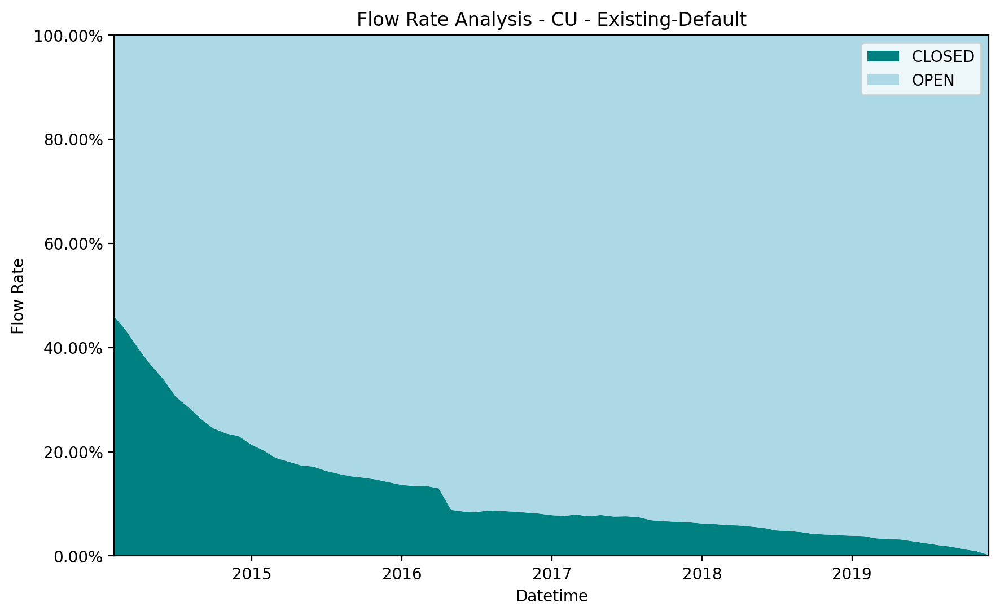

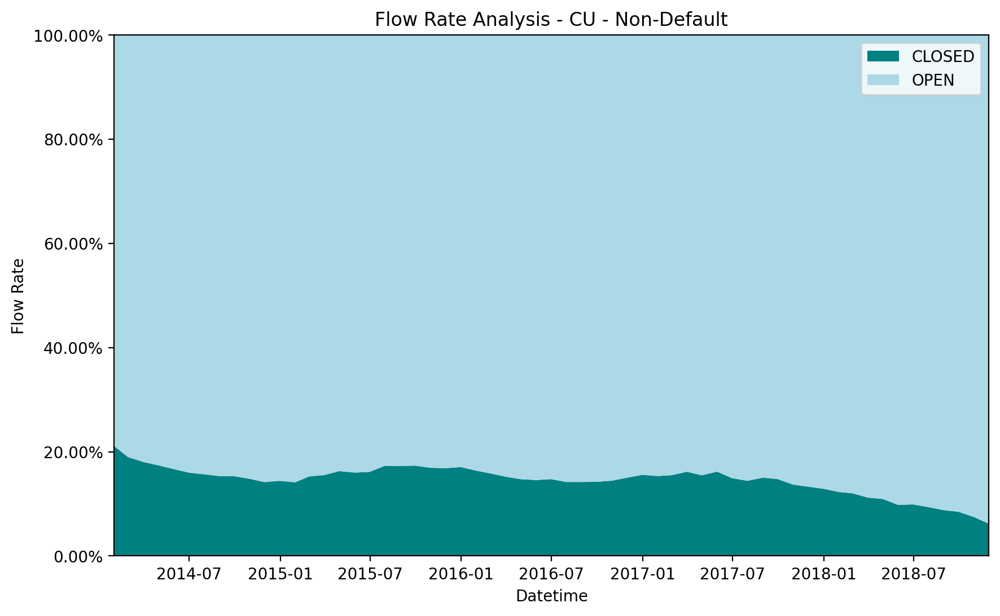

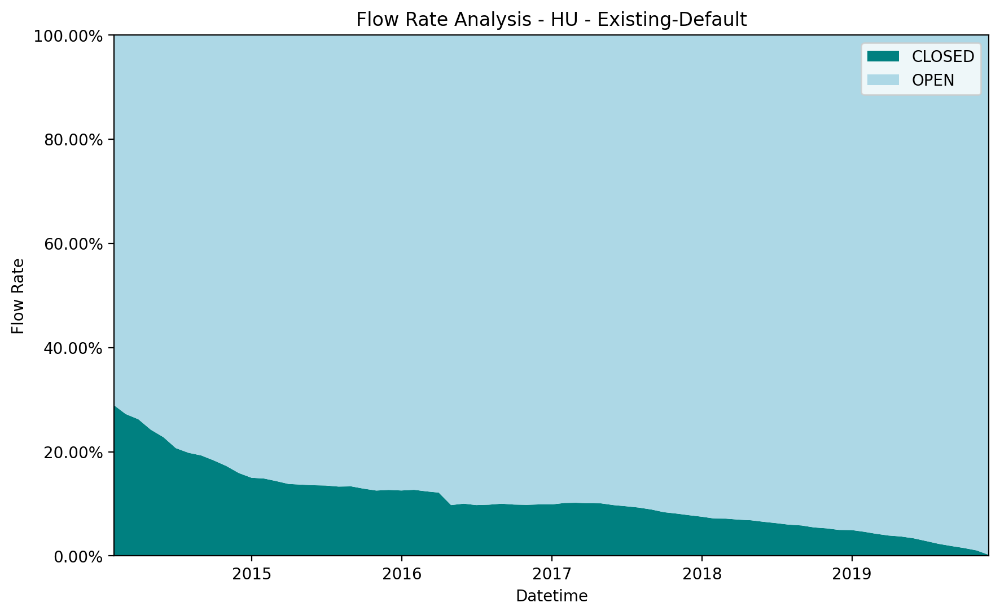

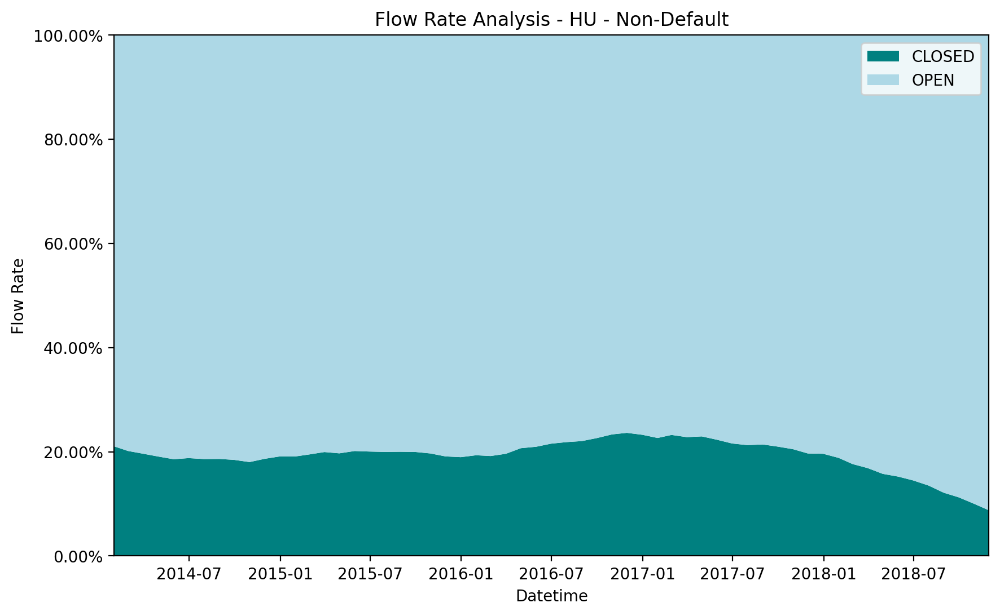

In [ ]:
# Plot
for segment in FlowRate['SEGMENT'].unique():
  for default in FlowRate['DEFAULT_FLAG'].unique():
    # Query data for plotting
    dataPlot = FlowRate.query("SEGMENT == @segment and DEFAULT_FLAG == @default")
    plt.figure(figsize = (10, 6))
    plt.stackplot(
        dataPlot['AS_OF_DATE'],
        dataPlot['CLOSED_RATE'],
        dataPlot['OPEN_RATE'],
        colors = ['teal', 'lightblue'],
        labels = ['CLOSED', 'OPEN']
    )
    plt.gca().set_yticklabels([f'{y * 100:.2f}%' for y in plt.gca().get_yticks()])
    plt.margins(0, 0)
    plt.xlabel('Datetime')
    plt.ylabel('Flow Rate')
    plt.title(
        f'Flow Rate Analysis - {segment} - {default}'
    )
    plt.legend(
        frameon = True,
        facecolor = 'white'
    )
    plt.show()

In [ ]:
# Flow rate summary
FlowRateSummary = df.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL'],
    as_index = False
).agg(
    N = ('ACCOUNT_ID', 'count')
)

FlowRateSummary['FLOW_RATE'] = FlowRateSummary['N'] / FlowRateSummary.groupby(
    ['SEGMENT', 'DEFAULT_FLAG']
)['N'].transform('sum')

# Show table
FlowRateSummary.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,N,FLOW_RATE
0,CU,Existing-Default,Closed,17524,0.068342
1,CU,Existing-Default,Open,238893,0.931658
2,CU,Non-Default,Closed,11338,0.142036
3,CU,Non-Default,Open,68487,0.857964
4,HU,Existing-Default,Closed,34670,0.074078


# Loss Rate
Each recovery pathway is calculated the loss rates by historical data of defaulted accounts. On each cohort observed year, the loan recovery is observed at transaction level until its lifetime. The recovery amounts are appended to each **Month After Default** to recovery curves. The exposure weighted recovery rates are calculated at each pathway level by following formula:

\begin{align}
        Recovery \ Rate = \frac{Recovery \ amount}{Exposure \ at \ Default}
    \end{align}

In [ ]:
# Recovery and Cost estimation
df['YEAR'] = df['AS_OF_DATE'].dt.year #Observed default by year
df = df.sort_values(by = ['ACCOUNT_ID', 'AS_OF_DATE']) #Sort data by month
lag = df['AS_OF_DATE'].nunique() #Lag until last observation

# 12-Month observed recovery and cost
for col in ['RECOVERY', 'COST']:
  for i in range(1, lag): #-1 for total observation because need at least 1 month to observe
    df[f'{col}{i}'] = df.groupby(['ACCOUNT_ID'])[col].shift(-i).astype(np.float32)
    if i % 10 == 0:
      print(f'Column: {df.columns[-1]} created')

Column: RECOVERY10 created
Column: RECOVERY20 created
Column: RECOVERY30 created
Column: RECOVERY40 created
Column: RECOVERY50 created
Column: RECOVERY60 created
Column: RECOVERY70 created
Column: COST10 created
Column: COST20 created
Column: COST30 created
Column: COST40 created
Column: COST50 created
Column: COST60 created
Column: COST70 created


In [ ]:
# Summary recovery rate
RecoveryTable = None

for i in range(1, lag):
  recoveryTable = df.groupby(
      ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR'],
      as_index = True
  )[f'RECOVERY{i}'].sum()
  if RecoveryTable is None:
    RecoveryTable = recoveryTable.copy()
  else:
    RecoveryTable = pd.concat(
        [RecoveryTable, recoveryTable],
        axis = 1,
        ignore_index = True
    )

RecoveryTable = RecoveryTable.replace(0, np.nan) #Replace 0 with nan to fill-in
RecoveryTable.columns = RecoveryTable.columns + 1 #Plus 1 for month after default
RecoveryTable[0] = 0 #Assign 0% Recovery for observed month
RecoveryTable.insert(0, 0, RecoveryTable.pop(0)) #Rearrange 0% to first column
RecoveryTable = RecoveryTable.reset_index() #Reset index

# Summary outstanding balance
RecoveryTable['OUTSTANDING'] = list(
    df.groupby(
        ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR']
    )['OUTSTANDING'].sum()
)

# Assign number for the different group
RecoveryTable['GROUP'] = RecoveryTable.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL']
).ngroup()

# Show table
RecoveryTable.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,0,1,2,3,4,5,...,63,64,65,66,67,68,69,70,OUTSTANDING,GROUP
0,CU,Existing-Default,Closed,2014,0,1571470.0,7.779942e+05,676774.0,668001.0,5.783901e+05,...,1130558.375,1119410.5,1108424.75,894929.375,279381.0625,131805.890625,NaN,NaN,1.059707e+09,0
1,CU,Existing-Default,Closed,2015,0,10936107.0,1.062536e+07,11632666.0,10976232.0,1.078139e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.523235e+09,0
2,CU,Existing-Default,Closed,2016,0,29188124.0,2.361919e+07,18928714.0,16161271.0,1.603682e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.464652e+09,0
3,CU,Existing-Default,Closed,2017,0,33414954.0,2.757344e+07,26538934.0,26182044.0,2.388166e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.471408e+09,0
4,CU,Existing-Default,Closed,2018,0,38260252.0,3.652962e+07,34312024.0,30898490.0,2.685671e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.294263e+09,0


In [ ]:
# Summary cost table to use later
CostTable = None

for i in range(1, lag):
  costTable = df.groupby(
      ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR'],
      as_index = True
  )[f'COST{i}'].sum()
  if CostTable is None:
    CostTable = costTable.copy()
  else:
    CostTable = pd.concat(
        [CostTable, costTable],
        axis = 1,
        ignore_index = True
    )

CostTable = CostTable.replace(0, np.nan) #Replace 0 with nan to fill-in
CostTable.columns = CostTable.columns + 1 #Plus 1 for month after default
CostTable[0] = 0 #Assign 0% Recovery for observed month
CostTable.insert(0, 0, CostTable.pop(0)) #Rearrange 0% to first column
CostTable = CostTable.reset_index() #Reset index

# Summary EIR for cost discounting
CostTable['EIR'] = list(
    df.groupby(
        ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR']
    ).apply(
        lambda x: np.average(
            x['EIR'],
            weights = x['OUTSTANDING']
        )
    )
)

# Show table
CostTable.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,0,1,2,3,4,5,...,62,63,64,65,66,67,68,69,70,EIR
0,CU,Existing-Default,Closed,2014,0,1.002552e+05,5.289218e+04,4.229645e+04,4.194917e+04,3.849360e+04,...,68308.703125,52076.679688,51724.5625,51210.277344,37031.601562,13579.957031,5652.113281,NaN,NaN,7.062609
1,CU,Existing-Default,Closed,2015,0,6.547989e+05,6.117098e+05,7.080964e+05,6.966302e+05,7.091364e+05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.228620
2,CU,Existing-Default,Closed,2016,0,1.816658e+06,1.488205e+06,1.156506e+06,1.033751e+06,1.009451e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.499389
3,CU,Existing-Default,Closed,2017,0,2.179558e+06,1.757404e+06,1.722190e+06,1.683300e+06,1.549377e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.617950
4,CU,Existing-Default,Closed,2018,0,2.371946e+06,2.325839e+06,2.227992e+06,1.973410e+06,1.684518e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.725425


In [ ]:
# Create long format recovery table
RecoverySummary = pd.melt(
    RecoveryTable.drop(
        ['GROUP'],
        axis = 1
    ),
    id_vars = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'OUTSTANDING'],
    var_name = 'MONTH_AFTER_DEFAULT',
    value_name = 'RECOVERY'
).sort_values(
    by = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'MONTH_AFTER_DEFAULT']
).reset_index(drop = True) #Sort by observed year

# Convert 'MONTH_AFTER_DEFAULT' to int
RecoverySummary['MONTH_AFTER_DEFAULT'] = RecoverySummary['MONTH_AFTER_DEFAULT'].astype(int)

# Show table
RecoverySummary.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,OUTSTANDING,MONTH_AFTER_DEFAULT,RECOVERY
0,CU,Existing-Default,Closed,2014,1.059707e+09,0,0.000000e+00
1,CU,Existing-Default,Closed,2014,1.059707e+09,1,1.571470e+06
2,CU,Existing-Default,Closed,2014,1.059707e+09,2,7.779942e+05
3,CU,Existing-Default,Closed,2014,1.059707e+09,3,6.767740e+05
4,CU,Existing-Default,Closed,2014,1.059707e+09,4,6.680010e+05


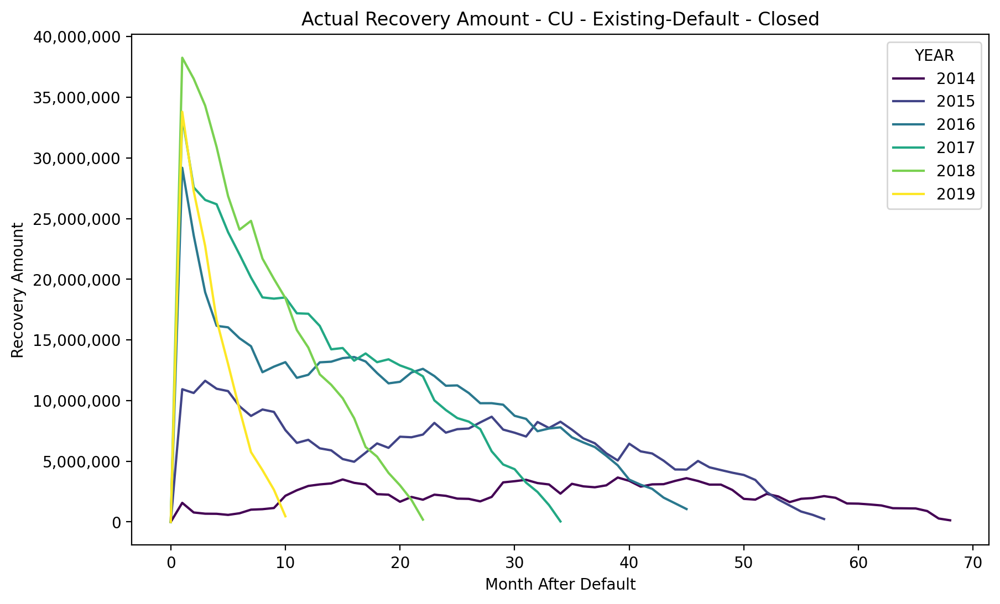

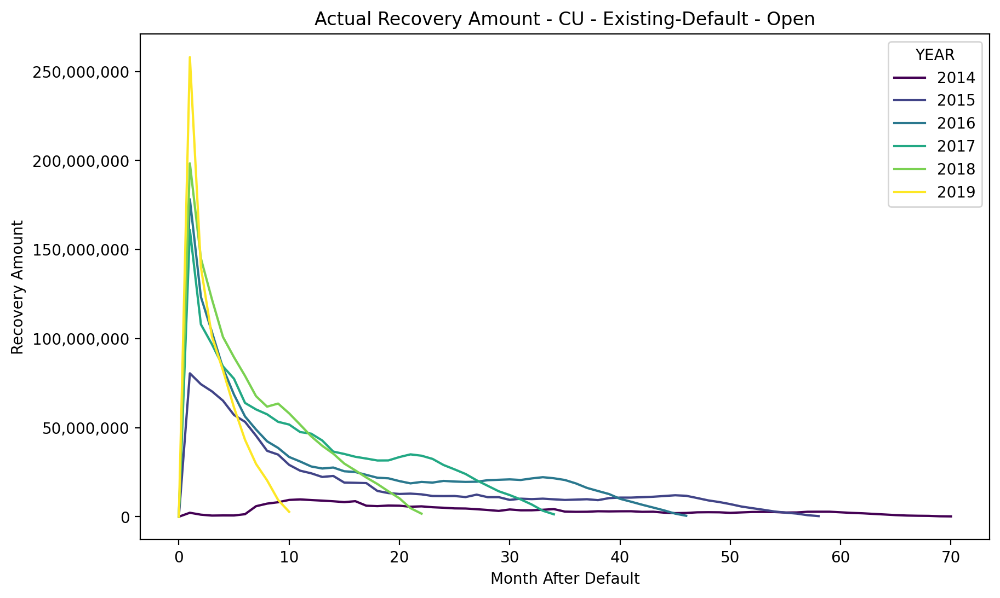

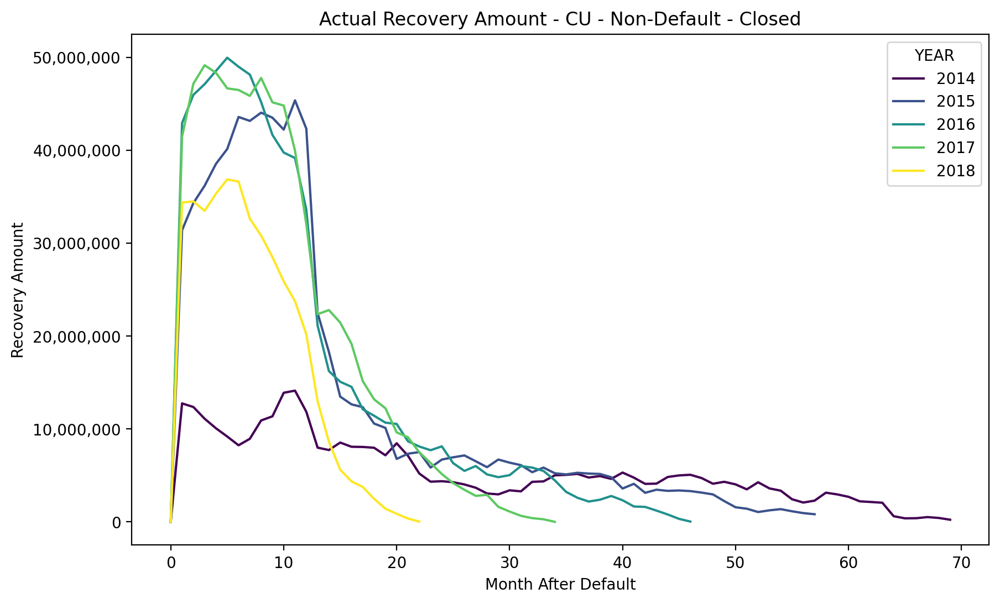

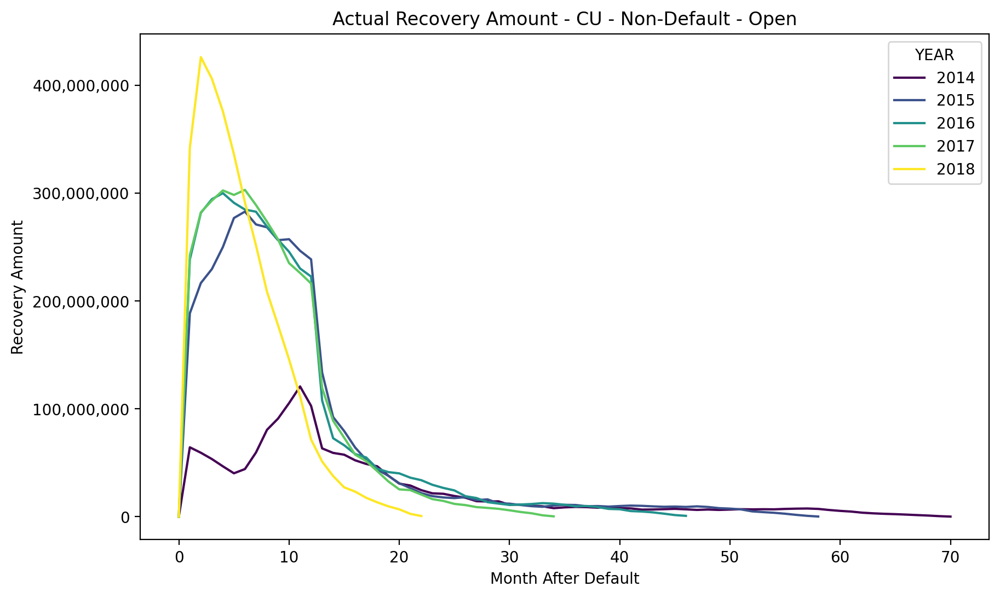

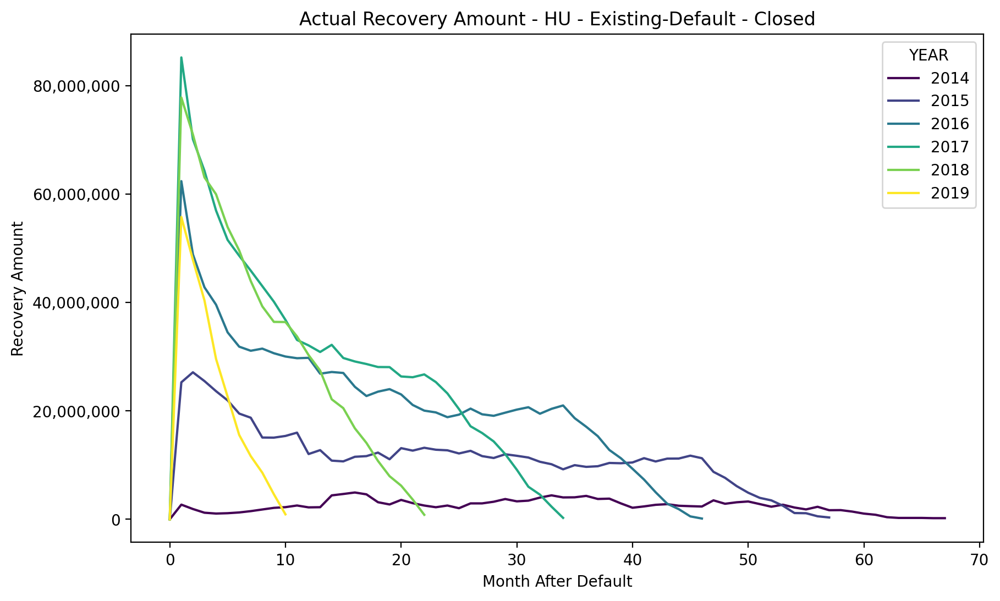

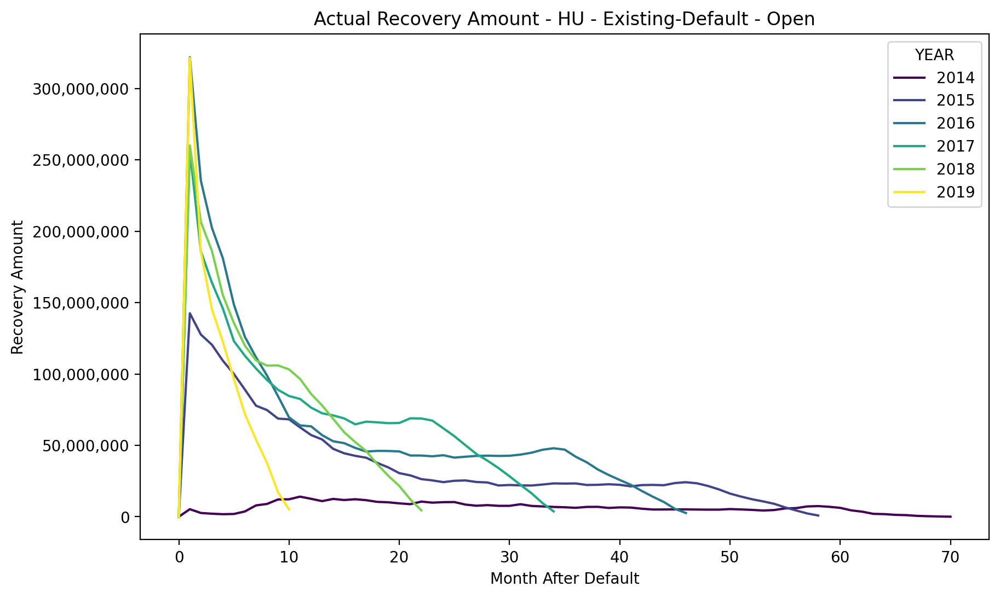

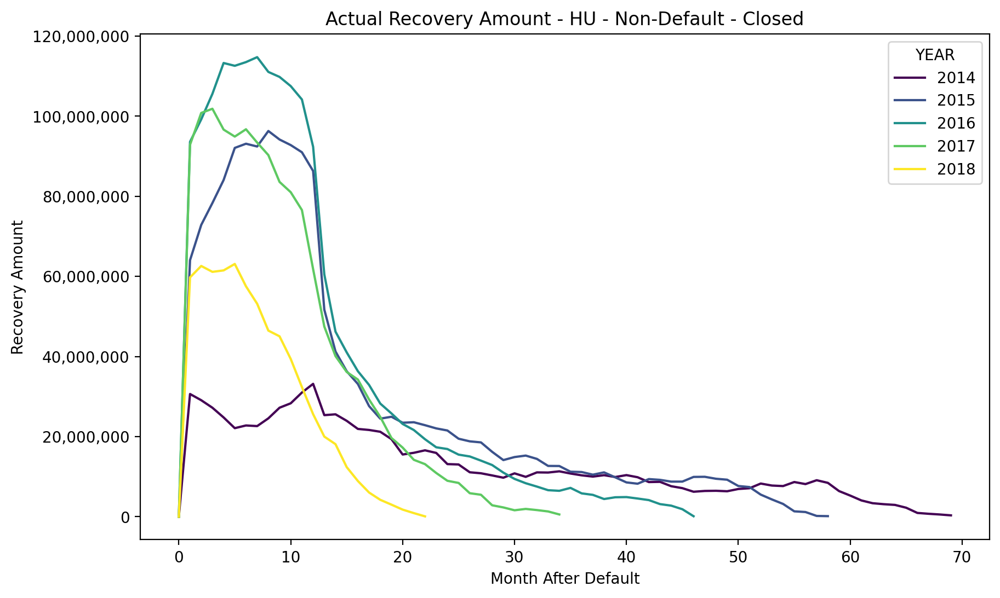

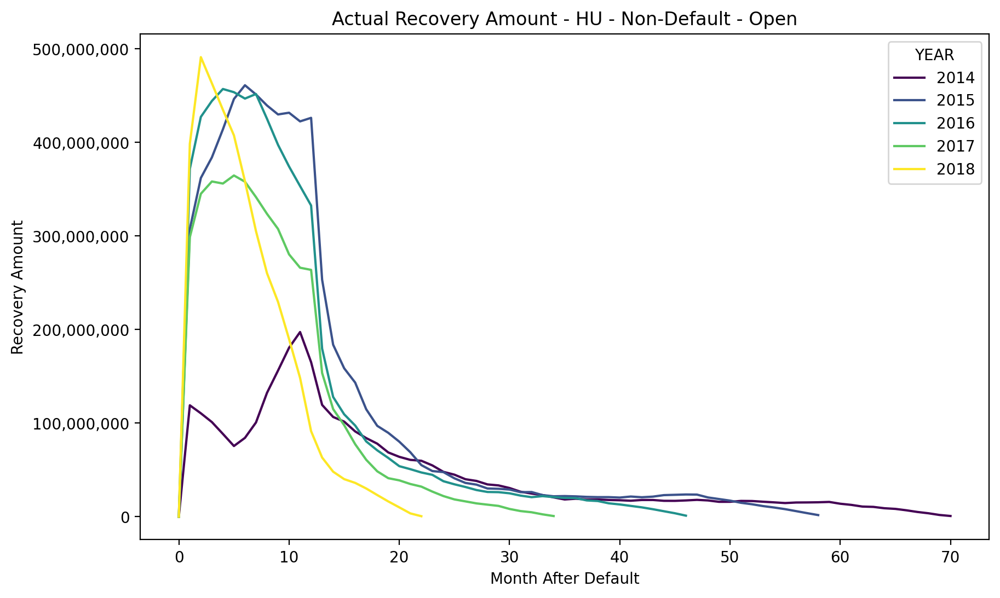

In [ ]:
# Plot recovery rate after default
for segment in RecoverySummary['SEGMENT'].unique():
  for default in RecoverySummary['DEFAULT_FLAG'].unique():
    for pool in RecoverySummary['DEFAULT_POOL'].unique():
      # Query data for plotting
      dataPlot = RecoverySummary.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")
      plt.figure(figsize = (10, 6))
      ax = sns.lineplot(
          x = 'MONTH_AFTER_DEFAULT',
          y = 'RECOVERY',
          data = dataPlot,
          hue = 'YEAR',
          legend = 'full',
          palette = 'viridis',
          ci = None
      )
      ax.yaxis.set_major_formatter(
          mtick.FuncFormatter(lambda x, pos: '{0:,.0f}'.format(x))
      )
      ax.set_title(
          f'Actual Recovery Amount - {segment} - {default} - {pool}'
      )
      ax.set(
          xlabel = 'Month After Default',
          ylabel = 'Recovery Amount'
      )
      plt.show()

# Recovery Rate Estimate
The recoveries rate estimate assumption for the LGD Model has to reflect the past payment behaviour and expectation to current portfolio. The recent cohort year does not contain sufficient data due to short length of observation data. Therefore, the recovery curves need to be extrapolated by the **Chain-ladder** method that are considered:


*   Obtain actual recovery curve for each cohort year
*   Calculate development factor by sum of recovery **forward** month after default `n + 1` divided by sum of **current** forward month after default `n`

\begin{align}
        Development \ Factor = \frac{Recovery \ amount_{n + 1}}{Recovery \ amount_{n}}
    \end{align}

*   Apply unobserved recovery curve with development factor to complete the insufficient data cohort year

In [ ]:
# Chain-ladder
# Calculate development factor
factors = []

for group in RecoveryTable['GROUP'].unique():
  # Query data for calculation
  data = RecoveryTable[RecoveryTable['GROUP'] == group]
  data = data.drop(
      ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'GROUP', 'OUTSTANDING'],
      axis = 1
  )
  factor = [0]
  for i in range(data.shape[1] - 1):
    if i > data.shape[1] - 2:
      break #Break statement i needs 2 forward windows to perform
    # Calculate development factor for all avaliable data
    forward = data.iloc[:, i + 1].dropna() #Select forward time, +1 for forward period
    current = data.iloc[:, i] #Select current avaliable based on forward avaliable, i for current period
    # Calculating factor based on forward window
    factor.extend([forward.sum() / current.iloc[:len(forward)].sum()]) #All avaliable of forward information
  factors.extend(factor)

In [ ]:
# Format shape of development factors
factors = np.array(factors) #1-D Array
factors = factors.reshape(
    RecoveryTable['SEGMENT'].nunique() * RecoveryTable['DEFAULT_FLAG'].nunique() * RecoveryTable['DEFAULT_POOL'].nunique(),
    -1
) #2-D Array

In [ ]:
# Imputation with factors
RecoveryChain = []

for group in RecoveryTable['GROUP'].unique():
  # Query data for calculation
  data = RecoveryTable[RecoveryTable['GROUP'] == group]
  data = data.set_index(['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'OUTSTANDING']) #Set index to keep information
  data = data.drop(
      ['GROUP'],
      axis = 1
  )
  # Select factor for imputation
  factor = factors[group]
  for i in range(data.shape[1]):
    for j in range(data.shape[0]):
      if pd.isnull(data.iloc[j, i]):
        data.iloc[j, i] = data.iloc[j, i - 1] * factor[i]
        pass
  RecoveryChain.append(data)

RecoveryChain = pd.concat(
    RecoveryChain,
    axis = 0,
    ignore_index = False
)
RecoveryChain = RecoveryChain.reset_index()

# Show table
RecoveryChain.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,OUTSTANDING,0,1,2,3,4,...,61,62,63,64,65,66,67,68,69,70
0,CU,Existing-Default,Closed,2014,1.059707e+09,0,1571470.0,7.779942e+05,676774.0,668001.0,...,1.437822e+06,1.355826e+06,1.130558e+06,1.119410e+06,1.108425e+06,894929.375000,279381.062500,131805.890625,NaN,NaN
1,CU,Existing-Default,Closed,2015,1.523235e+09,0,10936107.0,1.062536e+07,11632666.0,10976232.0,...,1.591436e+05,1.500680e+05,1.251345e+05,1.239006e+05,1.226847e+05,99054.178189,30922.955985,14588.776024,NaN,NaN
2,CU,Existing-Default,Closed,2016,1.464652e+09,0,29188124.0,2.361919e+07,18928714.0,16161271.0,...,2.139495e+05,2.017485e+05,1.682284e+05,1.665695e+05,1.649349e+05,133166.500548,41572.217451,19612.865261,NaN,NaN
3,CU,Existing-Default,Closed,2017,1.471408e+09,0,33414954.0,2.757344e+07,26538934.0,26182044.0,...,3.806911e+03,3.589812e+03,2.993372e+03,2.963856e+03,2.934769e+03,2369.498691,739.715427,348.981601,NaN,NaN
4,CU,Existing-Default,Closed,2018,1.294263e+09,0,38260252.0,3.652962e+07,34312024.0,30898490.0,...,1.019775e+04,9.616201e+03,8.018488e+03,7.939421e+03,7.861505e+03,6347.288580,1981.510815,934.833574,NaN,NaN


In [ ]:
# Create long format table
# Recovery imputed table
RecoveryChain = pd.melt(
    RecoveryChain,
    id_vars = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'OUTSTANDING'],
    var_name = 'MONTH_AFTER_DEFAULT',
    value_name = 'RECOVERY'
).sort_values(
    by = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'MONTH_AFTER_DEFAULT']
).reset_index(drop = True) #Sort by observed year

# Convert data types
for col in ['OUTSTANDING', 'MONTH_AFTER_DEFAULT', 'RECOVERY']:
  RecoveryChain[col] = RecoveryChain[col].astype(float)

# Show table
RecoveryChain.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,OUTSTANDING,MONTH_AFTER_DEFAULT,RECOVERY
0,CU,Existing-Default,Closed,2014,1.059707e+09,0.0,0.000000e+00
1,CU,Existing-Default,Closed,2014,1.059707e+09,1.0,1.571470e+06
2,CU,Existing-Default,Closed,2014,1.059707e+09,2.0,7.779942e+05
3,CU,Existing-Default,Closed,2014,1.059707e+09,3.0,6.767740e+05
4,CU,Existing-Default,Closed,2014,1.059707e+09,4.0,6.680010e+05


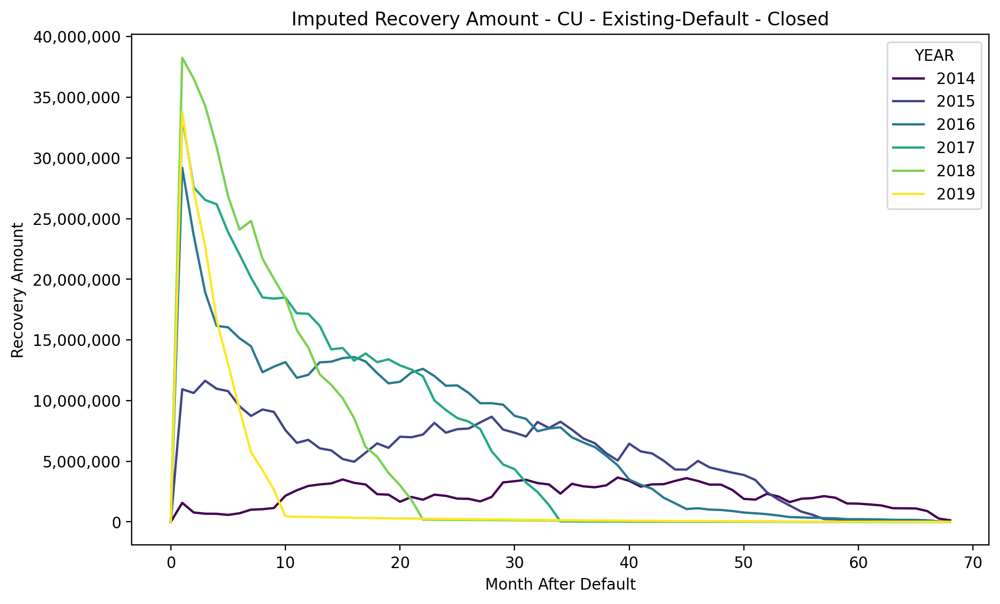

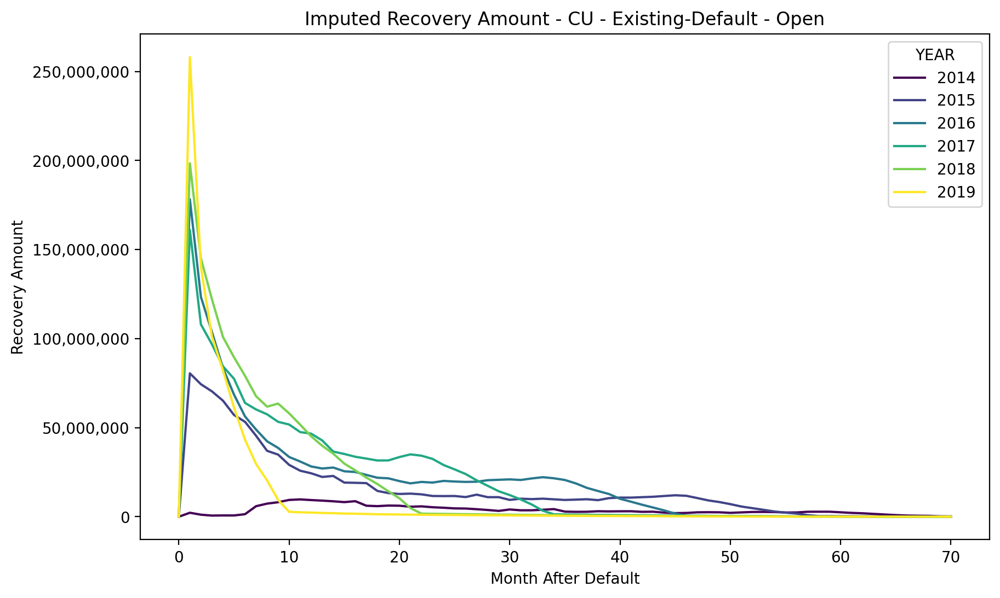

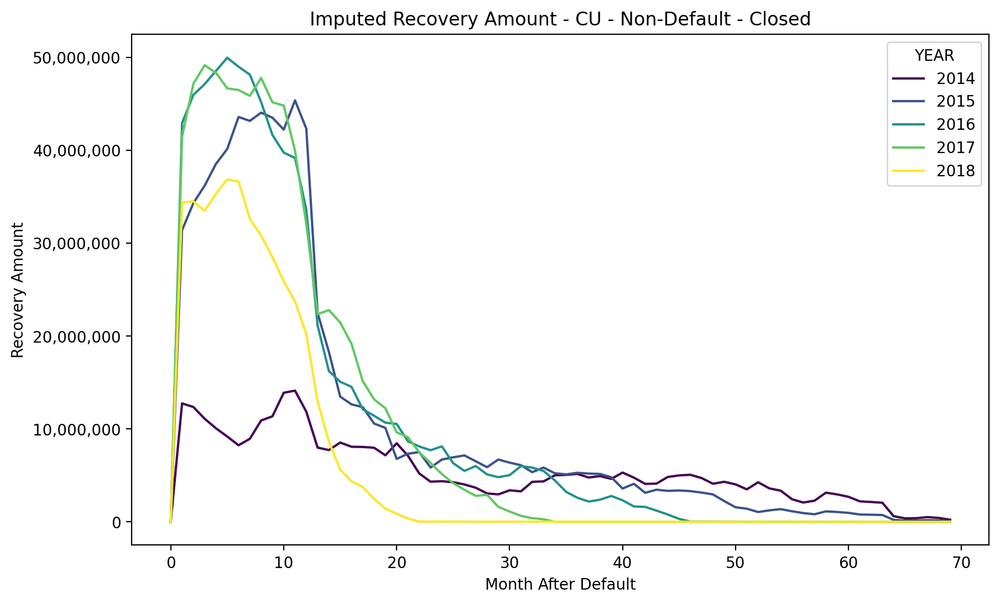

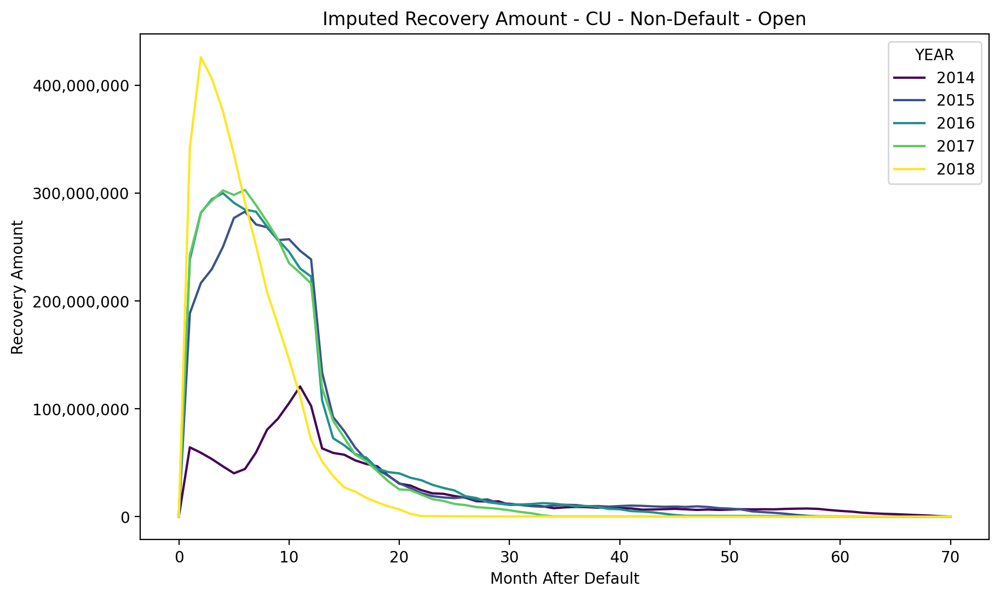

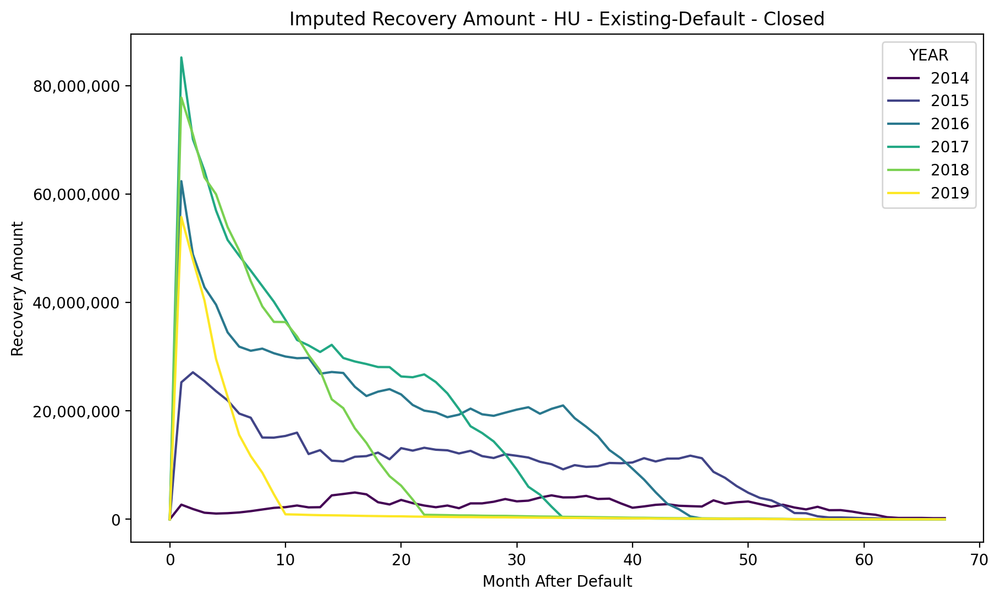

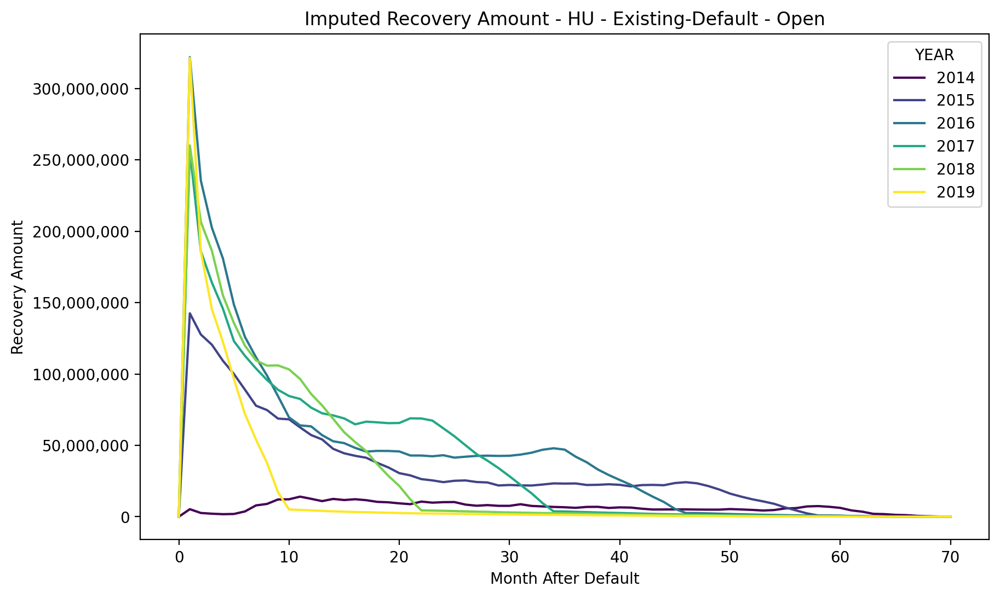

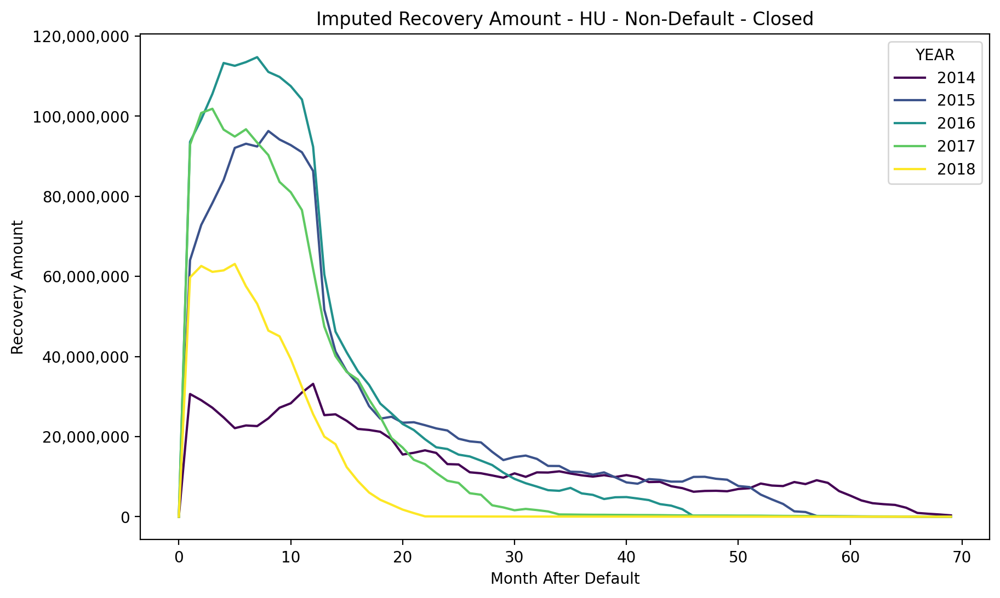

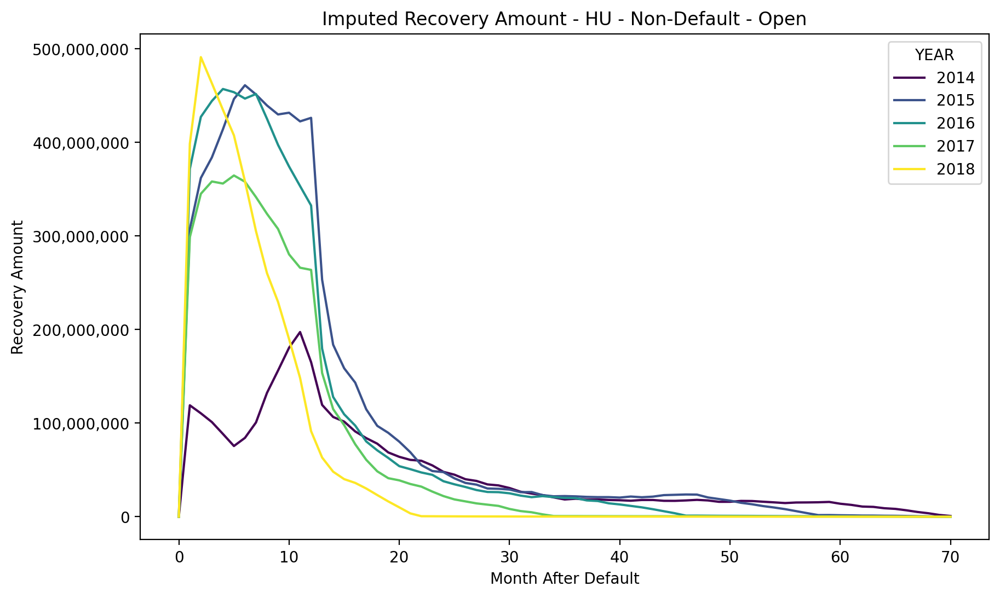

In [ ]:
# Plot imputed recovery
for segment in RecoveryChain['SEGMENT'].unique():
  for default in RecoveryChain['DEFAULT_FLAG'].unique():
    for pool in RecoveryChain['DEFAULT_POOL'].unique():
      # Query data for plotting
      dataPlot = RecoveryChain.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")
      plt.figure(figsize = (10, 6))
      ax = sns.lineplot(
          x = 'MONTH_AFTER_DEFAULT',
          y = 'RECOVERY',
          data = dataPlot,
          hue = 'YEAR',
          legend = 'full',
          palette = 'viridis',
          ci = None
      )
      ax.yaxis.set_major_formatter(
          mtick.FuncFormatter(lambda x, pos: '{0:,.0f}'.format(x))
      )
      ax.set_title(
          f'Imputed Recovery Amount - {segment} - {default} - {pool}'
      )
      ax.set(
          xlabel = 'Month After Default',
          ylabel = 'Recovery Amount'
      )
      plt.show()

In [ ]:
# Cumulative recovery
RecoveryChain['CUMULATIVE_RECOVERY'] = RecoveryChain.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR']
)['RECOVERY'].cumsum()

# Cumulative recovery rate
RecoveryChain['CUMULATIVE_RECOVERY_RATE'] = RecoveryChain['CUMULATIVE_RECOVERY'] / RecoveryChain['OUTSTANDING']

# Show table
RecoveryChain.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,OUTSTANDING,MONTH_AFTER_DEFAULT,RECOVERY,CUMULATIVE_RECOVERY,CUMULATIVE_RECOVERY_RATE
0,CU,Existing-Default,Closed,2014,1.059707e+09,0.0,0.000000e+00,0.000000e+00,0.000000
1,CU,Existing-Default,Closed,2014,1.059707e+09,1.0,1.571470e+06,1.571470e+06,0.001483
2,CU,Existing-Default,Closed,2014,1.059707e+09,2.0,7.779942e+05,2.349464e+06,0.002217
3,CU,Existing-Default,Closed,2014,1.059707e+09,3.0,6.767740e+05,3.026238e+06,0.002856
4,CU,Existing-Default,Closed,2014,1.059707e+09,4.0,6.680010e+05,3.694239e+06,0.003486


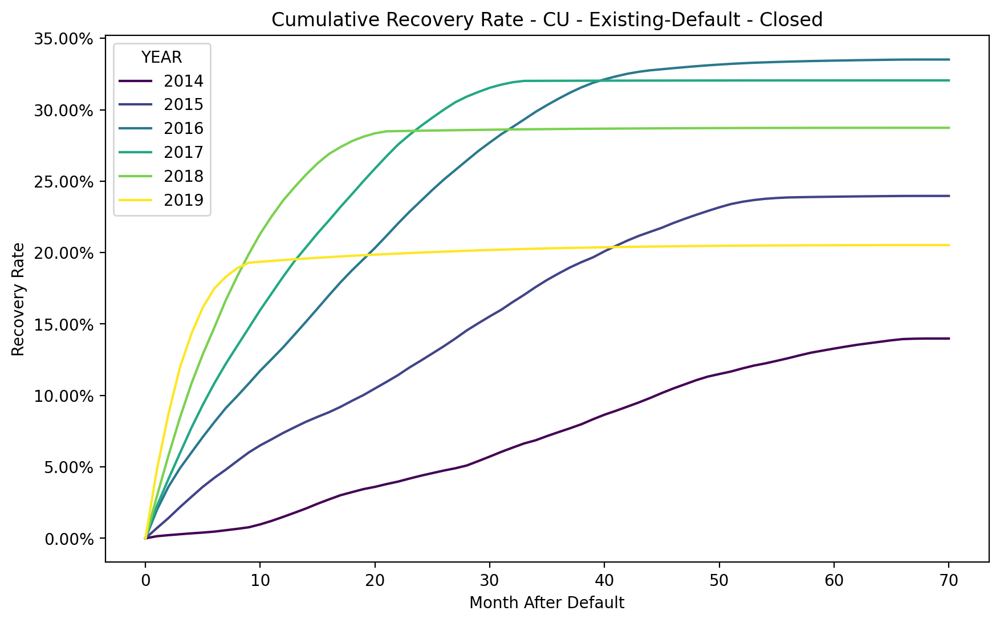

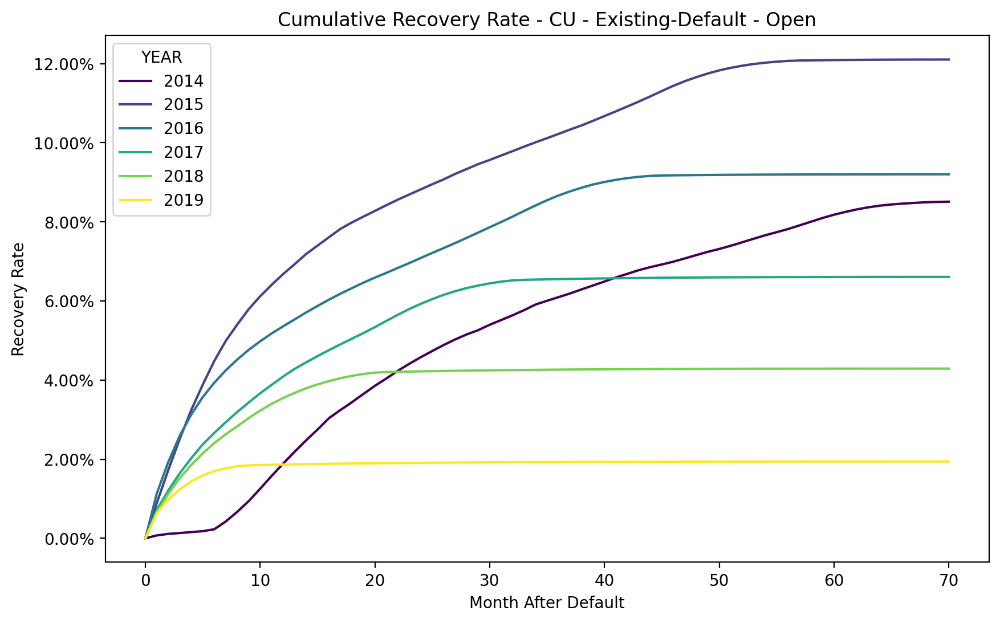

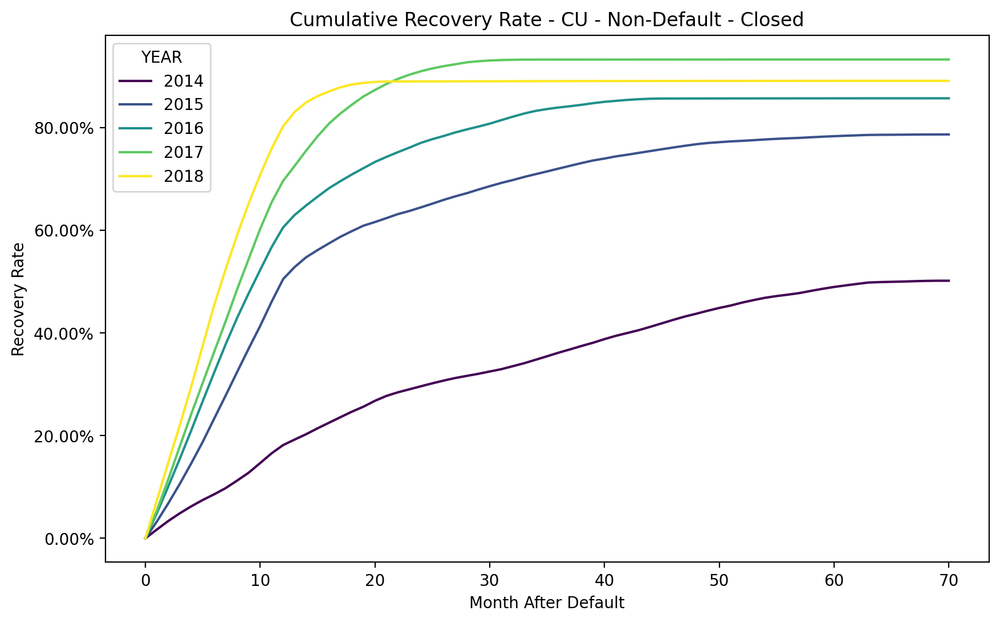

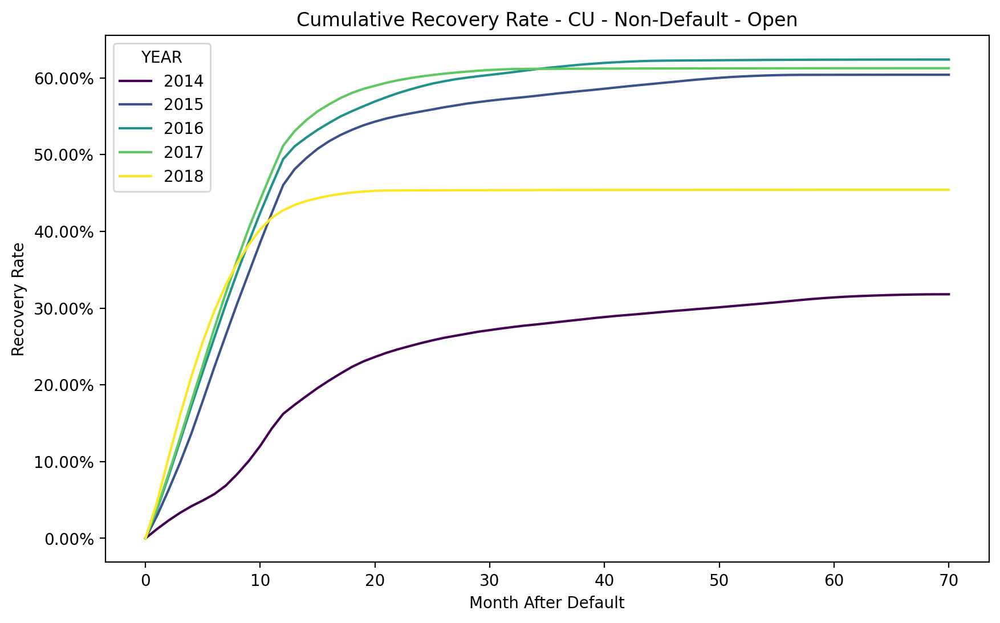

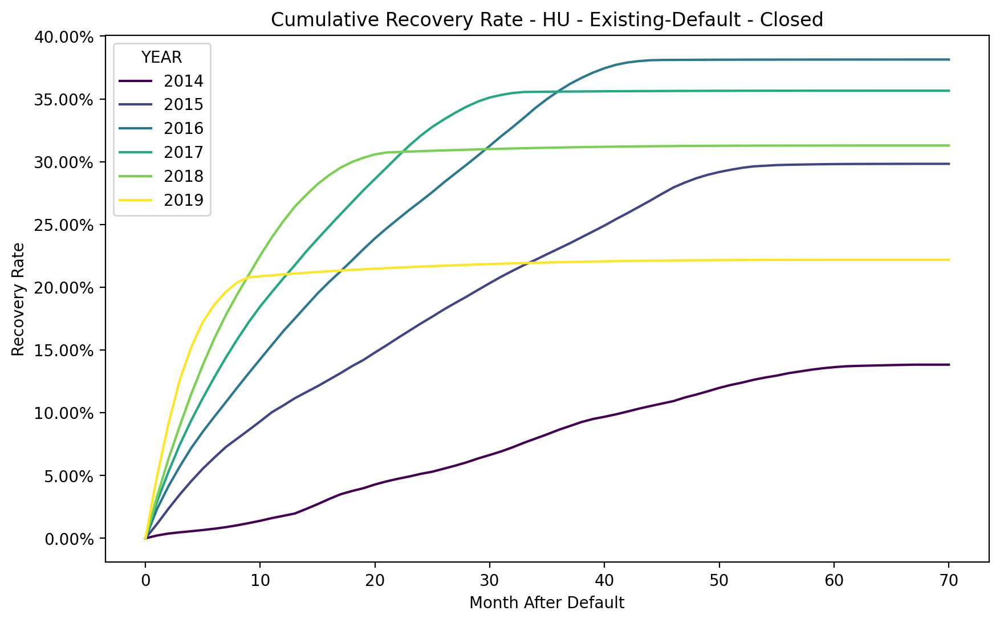

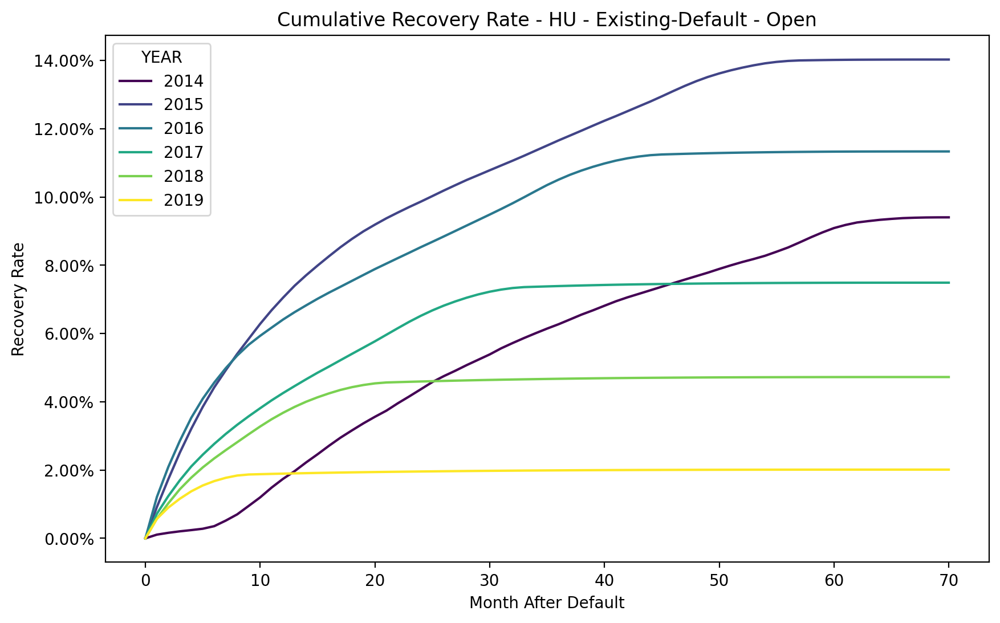

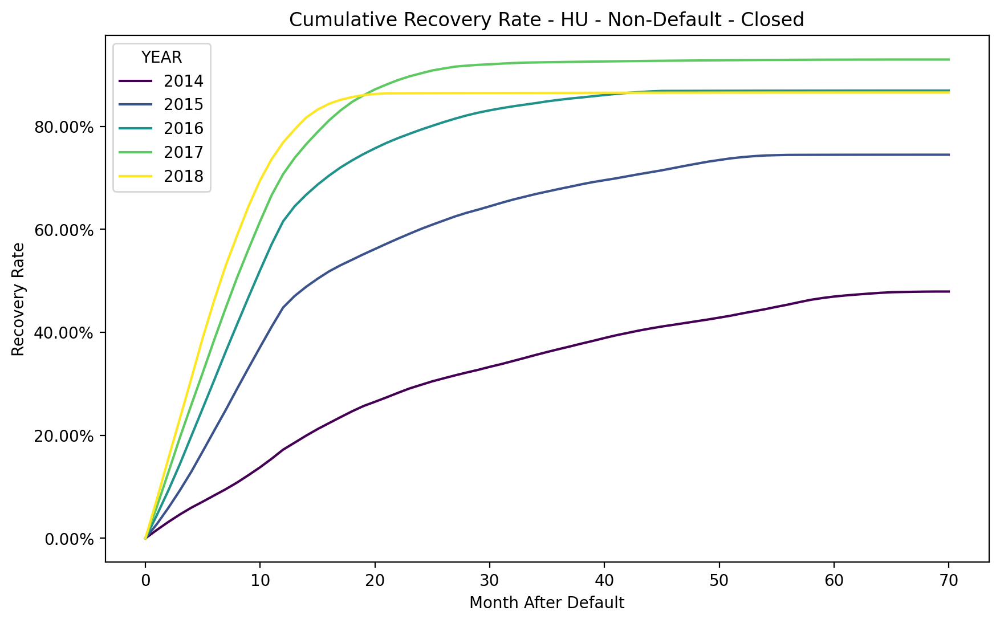

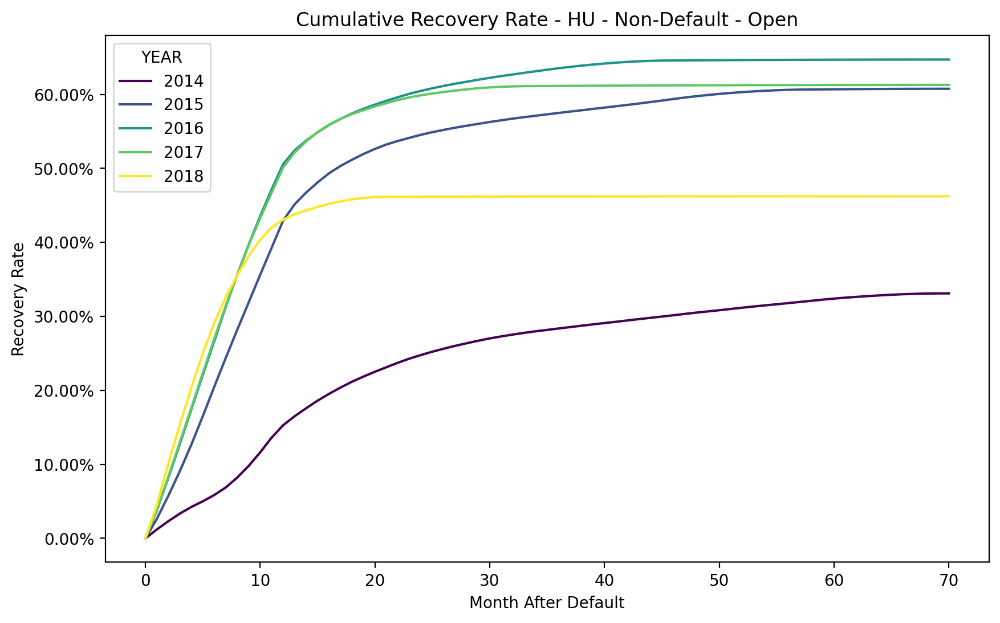

In [ ]:
# Plot cummulative recovery
for segment in RecoveryChain['SEGMENT'].unique():
  for default in RecoveryChain['DEFAULT_FLAG'].unique():
    for pool in RecoveryChain['DEFAULT_POOL'].unique():
      # Query data for plotting
      dataPlot = RecoveryChain.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")
      dataPlot['CUMULATIVE_RECOVERY_RATE'] = dataPlot['CUMULATIVE_RECOVERY_RATE'].ffill() #Forward fill for plotting only not for calcultion
      plt.figure(figsize = (10, 6))
      ax = sns.lineplot(
          x = 'MONTH_AFTER_DEFAULT',
          y = 'CUMULATIVE_RECOVERY_RATE',
          data = dataPlot,
          hue = 'YEAR',
          legend = 'full',
          palette = 'viridis',
          ci = None
      )
      ax.yaxis.set_major_formatter(
          mtick.FuncFormatter(lambda x, pos: '{0:.2f}%'.format(x * 100))
      )
      ax.set_title(
          f'Cumulative Recovery Rate - {segment} - {default} - {pool}'
      )
      ax.set(
          xlabel = 'Month After Default',
          ylabel = 'Recovery Rate'
      )
      plt.show()

In [ ]:
# Weighted average recovery
RecoveryWeighted = RecoveryChain.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'MONTH_AFTER_DEFAULT'],
    as_index = False
).apply(
    lambda x: pd.Series(
        {
            'CUMULATIVE_RECOVERY_RATE': np.average(
                x['CUMULATIVE_RECOVERY_RATE'],
                weights = x['OUTSTANDING']
            )
        }
    )
) #Apply lambda function with new column name

RecoveryWeighted['RECOVERY'] = list(
    RecoveryChain.groupby(
        ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'MONTH_AFTER_DEFAULT']
    )['RECOVERY'].sum()
)

RecoveryWeighted['OUTSTANDING'] = list(
    RecoveryChain.groupby(
        ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'MONTH_AFTER_DEFAULT']
    )['OUTSTANDING'].sum()
)

# Show table
RecoveryWeighted.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,MONTH_AFTER_DEFAULT,CUMULATIVE_RECOVERY_RATE,RECOVERY,OUTSTANDING
0,CU,Existing-Default,Closed,0.0,0.000000,0.000000e+00,7.515116e+09
1,CU,Existing-Default,Closed,1.0,0.019584,1.471746e+08,7.515116e+09
2,CU,Existing-Default,Closed,2.0,0.036402,1.263895e+08,7.515116e+09
3,CU,Existing-Default,Closed,3.0,0.051682,1.148304e+08,7.515116e+09
4,CU,Existing-Default,Closed,4.0,0.065191,1.015214e+08,7.515116e+09


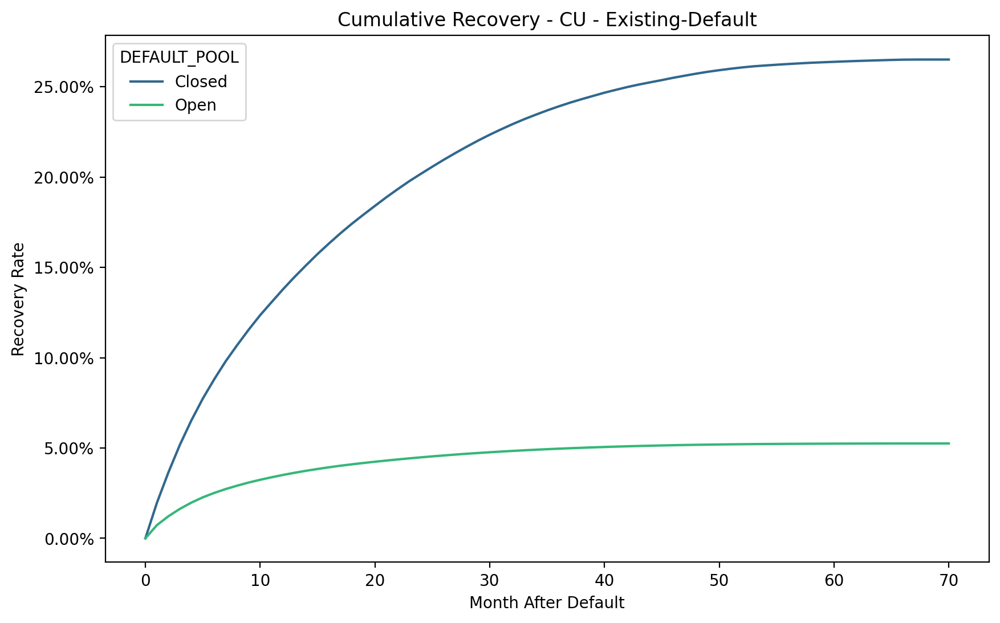

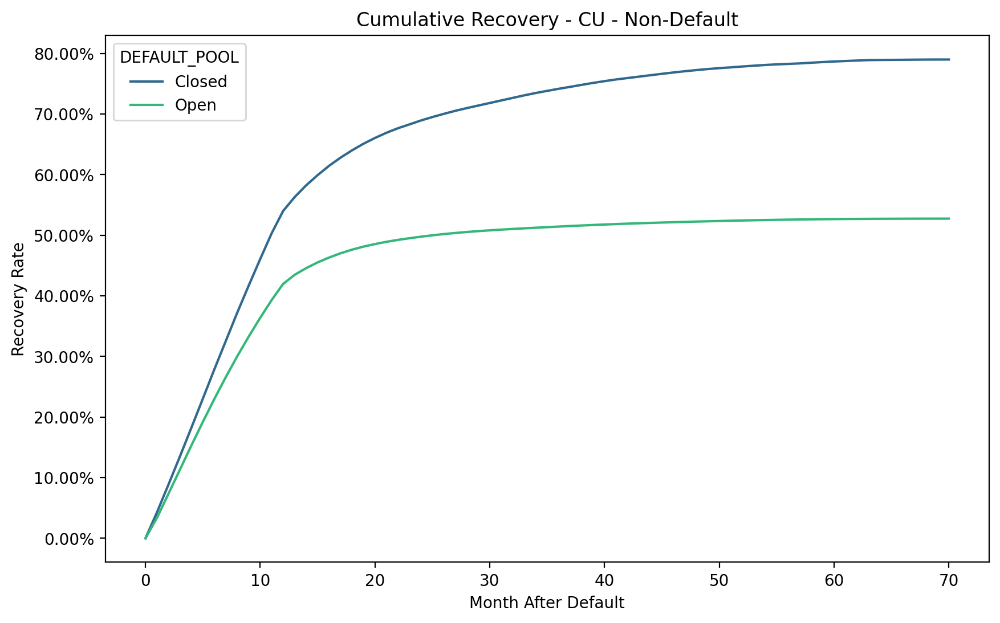

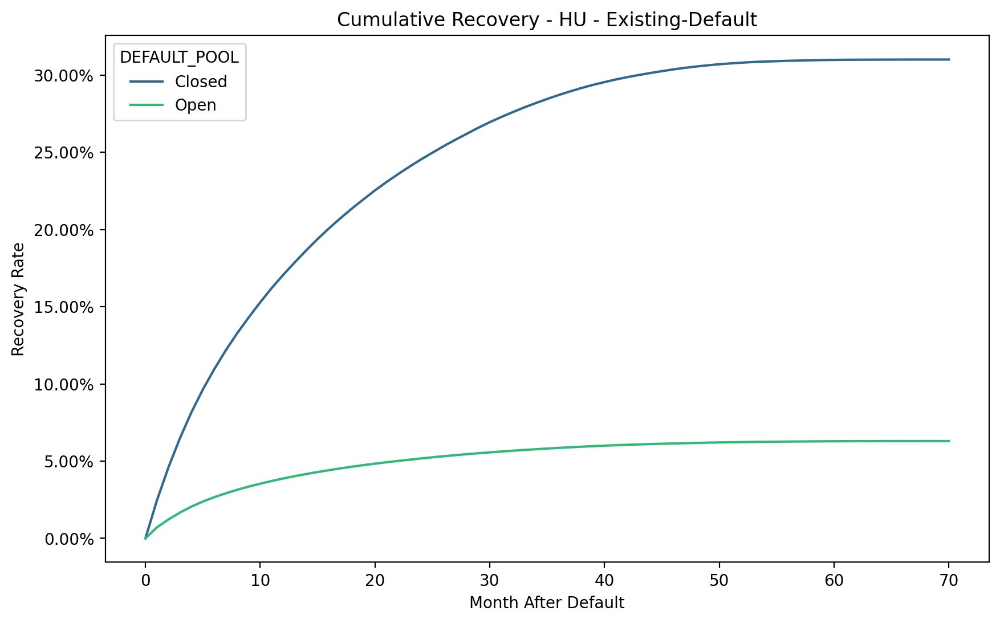

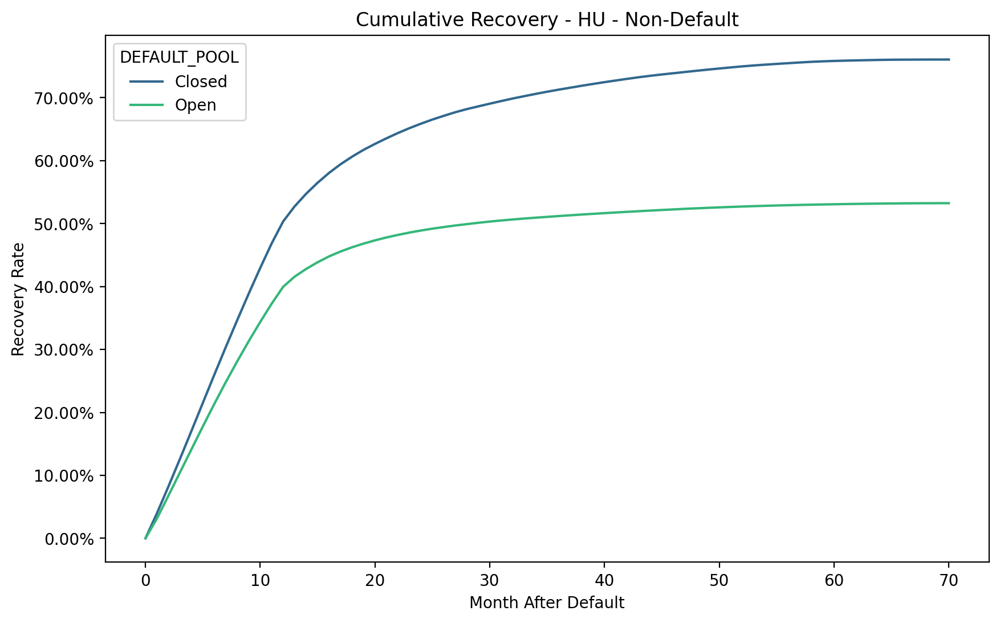

In [ ]:
# Plot average recovery
for segment in RecoveryWeighted['SEGMENT'].unique():
  for default in RecoveryWeighted['DEFAULT_FLAG'].unique():
    # Query data for plotting
    dataPlot = RecoveryWeighted.query("SEGMENT == @segment and DEFAULT_FLAG == @default")
    dataPlot['CUMULATIVE_RECOVERY_RATE'] = dataPlot['CUMULATIVE_RECOVERY_RATE'].ffill() #Forward fill for plotting only not for calcultion
    plt.figure(figsize = (10, 6))
    ax = sns.lineplot(
        x = 'MONTH_AFTER_DEFAULT',
        y = 'CUMULATIVE_RECOVERY_RATE',
        data = dataPlot,
        hue = 'DEFAULT_POOL',
        legend = 'full',
        palette = 'viridis',
        ci = None
    )
    ax.yaxis.set_major_formatter(
        mtick.FuncFormatter(lambda x, pos: '{0:.2f}%'.format(x * 100))
    )
    ax.set_title(
        f'Cumulative Recovery - {segment} - {default}'
    )
    ax.set(
        xlabel = 'Month After Default',
        ylabel = 'Recovery Rate'
    )
    plt.show()

# EIR Linkage Function Before Direct Cost
The weighted recovery rates are calculated using all recovery rates of cohort years. It will be expressed as a function of EIR. The weighted recovery rates at each month after default are discounted using a range of EIRs to generate a range of discounted recoveries (PV of Recovery).

On each EIR Rate, the Discounted Recovery Rate (DRR) on month after defaults will be aggregated. The Loss rate is calculated by following formula:

\begin{align}
        Loss \ Rate = 1 \ - \ \frac{PV \ of \ Recovery}{Exposure \ at \ Default}
    \end{align}

A linear function is fitted to determine the relationship between the estimated **Loss Rate** and **EIR(s)**. The selected EIR range is minimum EIR and maximum EIR observed from historical data by incremental of 0.05%

The fitted loss rate functions are the following forms:

\begin{align}
        \text{Loss Rate} \ = \text{Intercept + EIR x β}
    \end{align}

In [ ]:
# EIR Linkage loss rate function
# Summary of EIR Rates by pools
EIRSummary = df.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL'],
    as_index = False
).agg(
    MAX_EIR = ('EIR', 'max'),
    MIN_EIR = ('EIR', 'min')
)

# Show table
EIRSummary

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,MAX_EIR,MIN_EIR
0,CU,Existing-Default,Closed,11.402998,0.000474
1,CU,Existing-Default,Open,12.034949,0.001272
2,CU,Non-Default,Closed,11.402998,0.000474
3,CU,Non-Default,Open,12.034949,0.001272
4,HU,Existing-Default,Closed,10.488700,0.000004
5,HU,Existing-Default,Open,17.537693,0.000001
6,HU,Non-Default,Closed,10.488700,0.000001
7,HU,Non-Default,Open,13.515939,0.000001


In [ ]:
# Create EIR(s) range
'''
It is observed that the minimum EIR(s) are almost zero.
Thus, 0.05% of EIR is set as the lowest rate.
Also, the maximum EIR(s) are set to nearest of x.05%.
'''
EIRSummary['MAX_EIR'] = EIRSummary['MAX_EIR'].apply(
    lambda x: round(x * 2) / 2
) #Nearest 0.05 round function

EIRRange = None
step = 0.05

for i in EIRSummary.index:
  data = EIRSummary.iloc[i, :]
  range = pd.DataFrame(
      np.arange(
          0.05,
          data['MAX_EIR'] + step,
          step
      ),
      columns = ['EIR']
  )
  range['SEGMENT'] = data['SEGMENT']
  range['DEFAULT_FLAG'] = data['DEFAULT_FLAG']
  range['DEFAULT_POOL'] = data['DEFAULT_POOL']
  if EIRRange is None:
    EIRRange = range.copy()
  else:
    EIRRange = pd.concat(
        [EIRRange, range],
        axis = 0,
        ignore_index = False
    )

In [ ]:
# Mapping EIR to recovery table
RecoveryWeighted = RecoveryWeighted.query("MONTH_AFTER_DEFAULT > 0") #Selecting month after default only
RecoveryWeighted = pd.merge(
    RecoveryWeighted,
    EIRRange[['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'EIR']],
    how = 'left',
    left_on = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL'],
    right_on = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL']
).sort_values(
    by = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'EIR', 'MONTH_AFTER_DEFAULT']
)

# Discount recovery with EIR
RecoveryWeighted['PV_RECOVERY'] = RecoveryWeighted['RECOVERY'] / (1 + RecoveryWeighted['EIR'] / 100 / 12) ** RecoveryWeighted['MONTH_AFTER_DEFAULT']

# Show table
RecoveryWeighted.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,MONTH_AFTER_DEFAULT,CUMULATIVE_RECOVERY_RATE,RECOVERY,OUTSTANDING,EIR,PV_RECOVERY
0,CU,Existing-Default,Closed,1.0,0.019584,1.471746e+08,7.515116e+09,0.05,1.471685e+08
230,CU,Existing-Default,Closed,2.0,0.036402,1.263895e+08,7.515116e+09,0.05,1.263790e+08
460,CU,Existing-Default,Closed,3.0,0.051682,1.148304e+08,7.515116e+09,0.05,1.148161e+08
690,CU,Existing-Default,Closed,4.0,0.065191,1.015214e+08,7.515116e+09,0.05,1.015045e+08
920,CU,Existing-Default,Closed,5.0,0.077320,9.114934e+07,7.515116e+09,0.05,9.113035e+07


In [ ]:
# Discounted Recovery Rates (DRR)
DRR = RecoveryWeighted.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'EIR'],
    as_index = False
).agg(
    PV_RECOVERY = ('PV_RECOVERY', 'sum'),
    OUTSTANDING = ('OUTSTANDING', 'max') #Equal amount can take max
)
DRR['DRR'] = DRR['PV_RECOVERY'] / DRR['OUTSTANDING']
DRR['LOSS_RATE'] = 1 - DRR['DRR']

# Show table
DRR.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,EIR,PV_RECOVERY,OUTSTANDING,DRR,LOSS_RATE
0,CU,Existing-Default,Closed,0.05,1.990478e+09,7.515116e+09,0.264863,0.735137
1,CU,Existing-Default,Closed,0.10,1.989169e+09,7.515116e+09,0.264689,0.735311
2,CU,Existing-Default,Closed,0.15,1.987861e+09,7.515116e+09,0.264515,0.735485
3,CU,Existing-Default,Closed,0.20,1.986554e+09,7.515116e+09,0.264341,0.735659
4,CU,Existing-Default,Closed,0.25,1.985249e+09,7.515116e+09,0.264167,0.735833


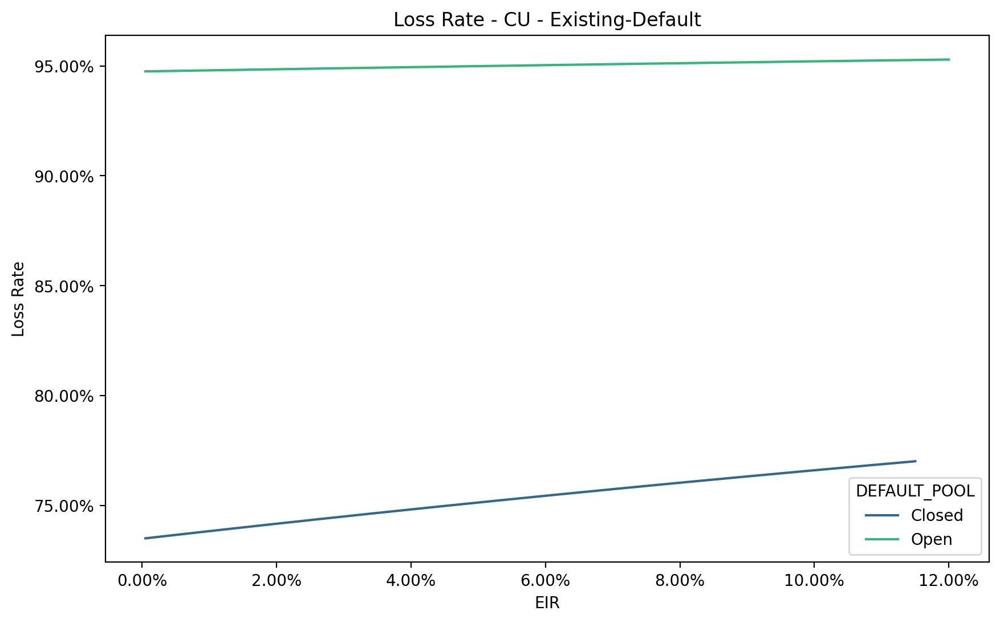

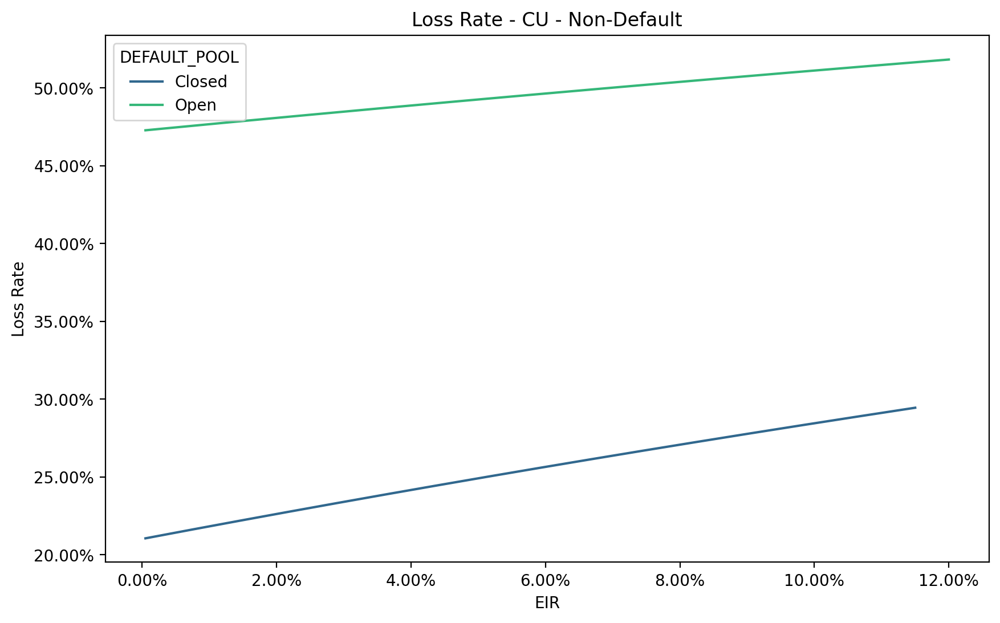

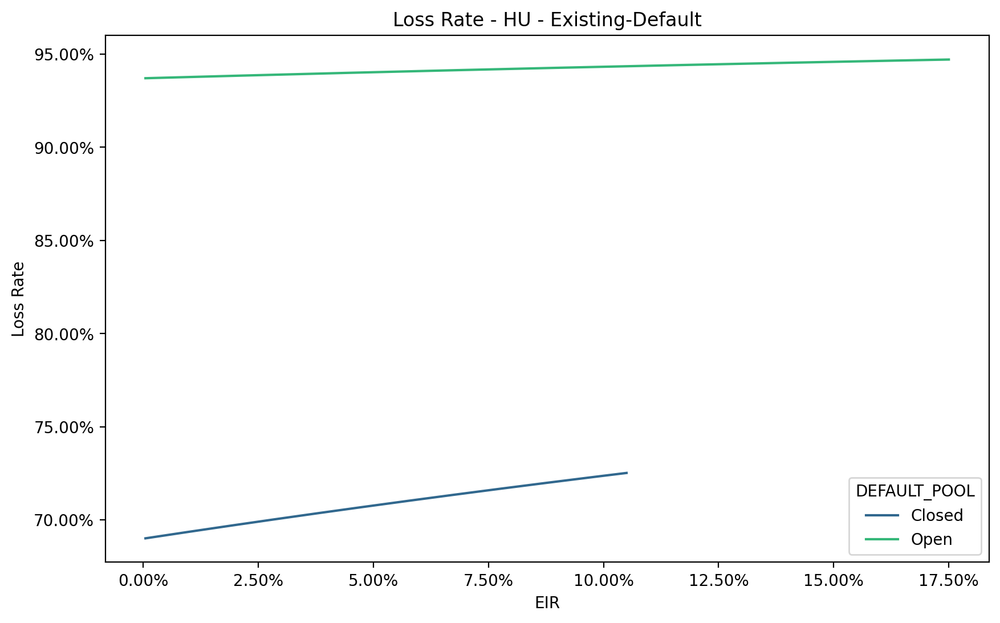

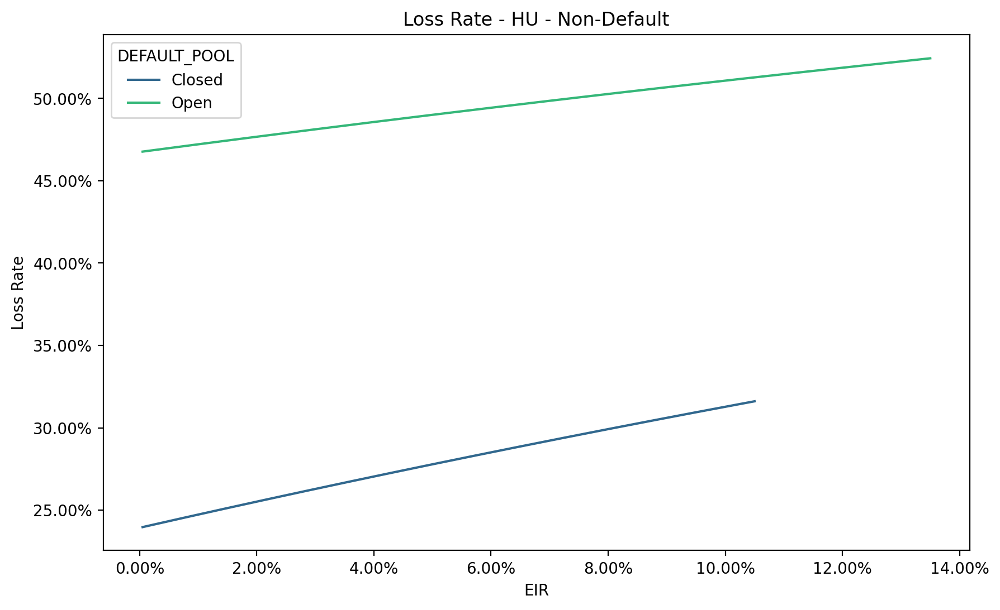

In [ ]:
# Plot LGD
for segment in DRR['SEGMENT'].unique():
  for default in DRR['DEFAULT_FLAG'].unique():
    # Query data for plotting
    dataPlot = DRR.query("SEGMENT == @segment and DEFAULT_FLAG == @default")
    plt.figure(figsize = (10, 6))
    ax = sns.lineplot(
        x = 'EIR',
        y = 'LOSS_RATE',
        data = dataPlot,
        hue = 'DEFAULT_POOL',
        legend = 'full',
        palette = 'viridis',
        ci = None
    )
    ax.yaxis.set_major_formatter(
        mtick.FuncFormatter(lambda x, pos: '{0:.2f}%'.format(x * 100))
    )
    ax.xaxis.set_major_formatter(
        mtick.FuncFormatter(lambda x, pos: '{0:.2f}%'.format(x))
    )
    ax.set_title(
        f'Loss Rate - {segment} - {default}'
    )
    ax.set(
        xlabel = 'EIR',
        ylabel = 'Loss Rate'
    )
    plt.show()

In [ ]:
# EIR Linkage loss rate function
FUNCTION = None

for segment in DRR['SEGMENT'].unique():
  for default in DRR['DEFAULT_FLAG'].unique():
    for pool in DRR['DEFAULT_POOL'].unique():
      # Query data for model
      dataModel = DRR.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")
      yTrain = dataModel['LOSS_RATE']
      XTrain = sm.add_constant(dataModel['EIR'], has_constant = 'add')
      function = sm.OLS(yTrain, XTrain).fit()
      # Keep function
      functionObject = {f'{segment}_{default}_{pool}': function}
      if FUNCTION is None:
        FUNCTION = functionObject.copy()
      else:
        FUNCTION.update(functionObject)

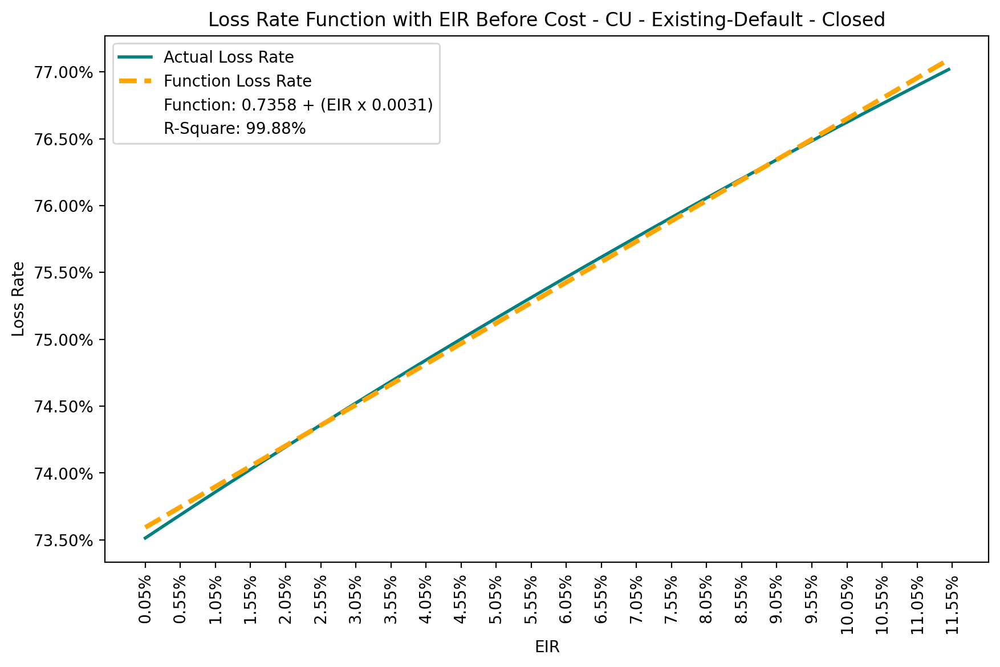

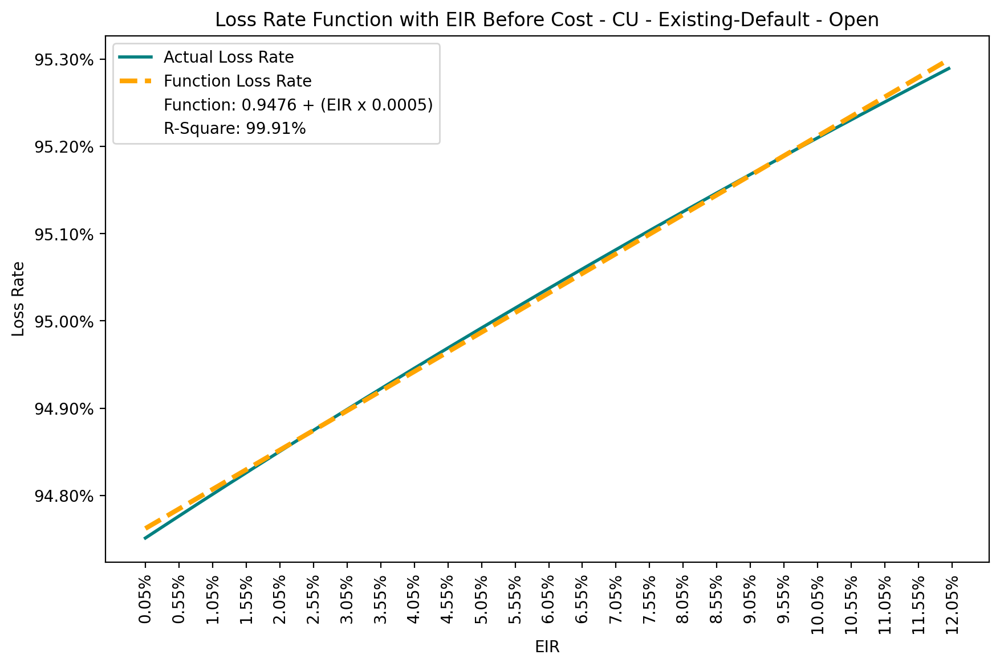

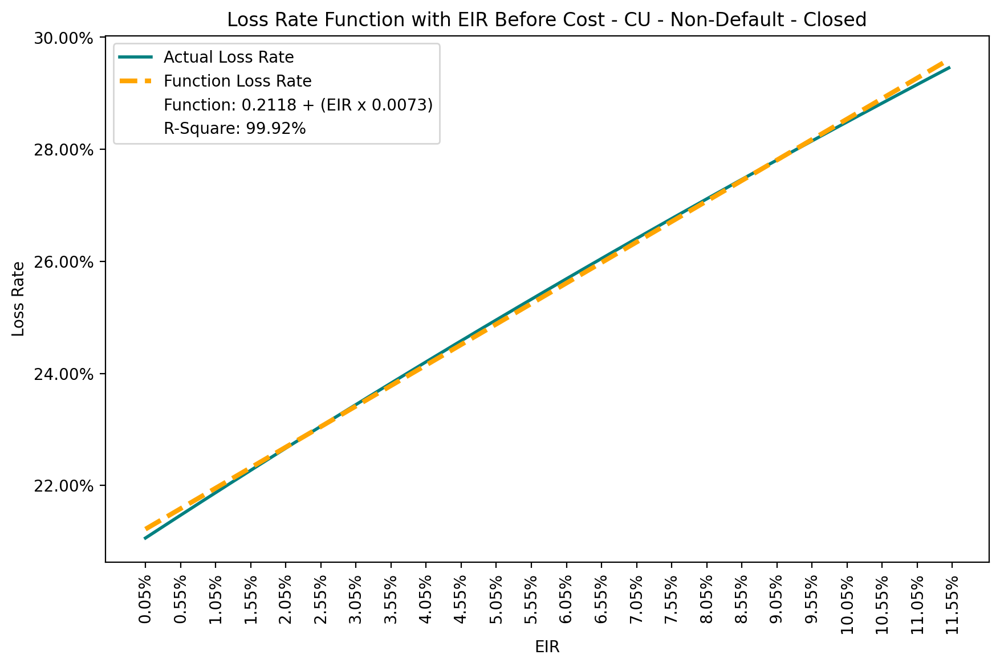

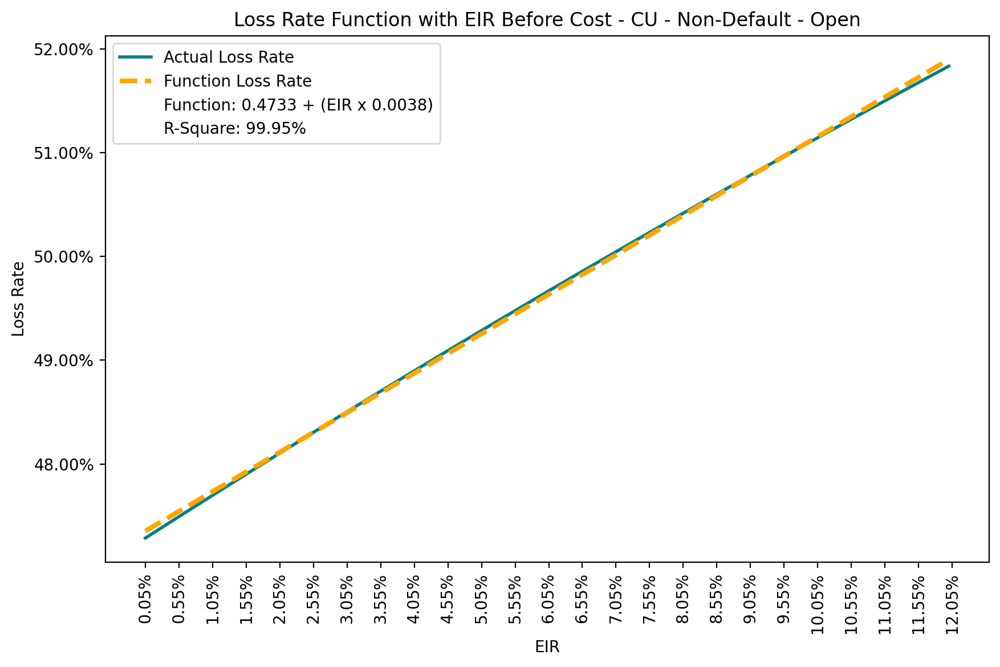

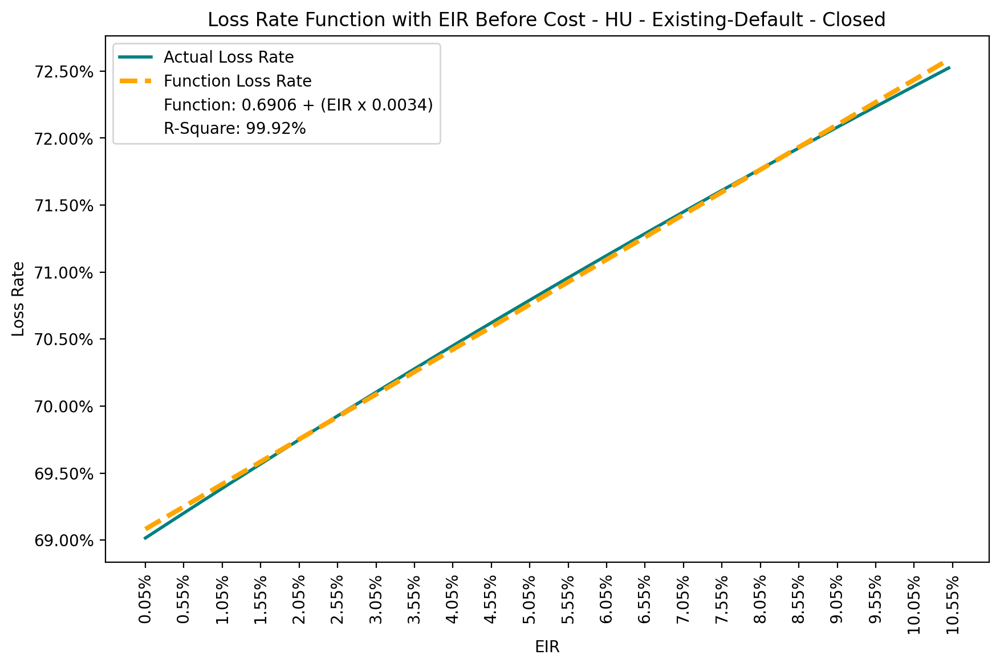

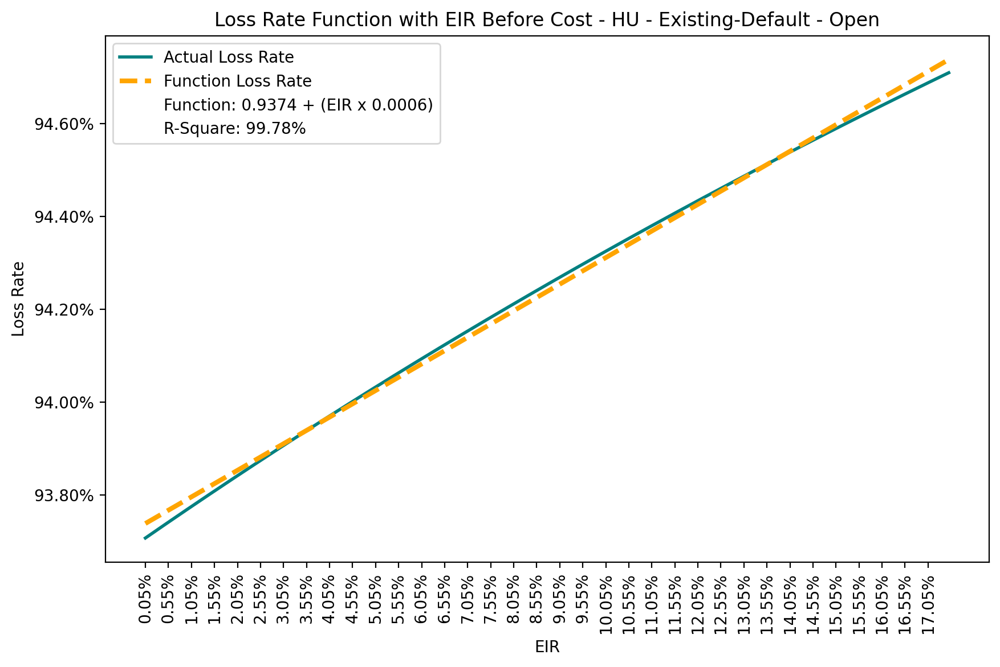

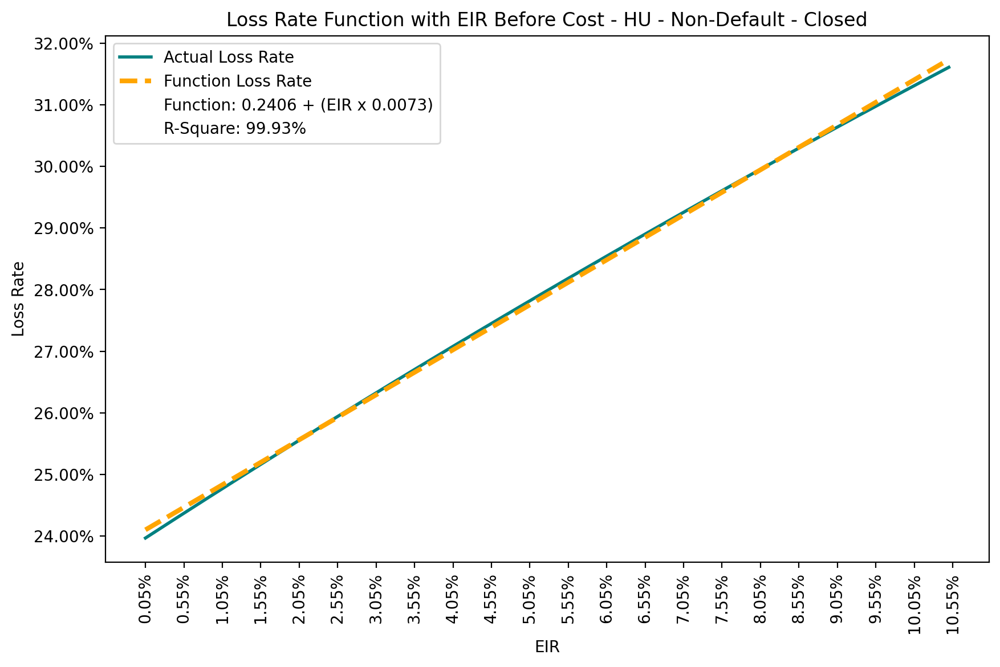

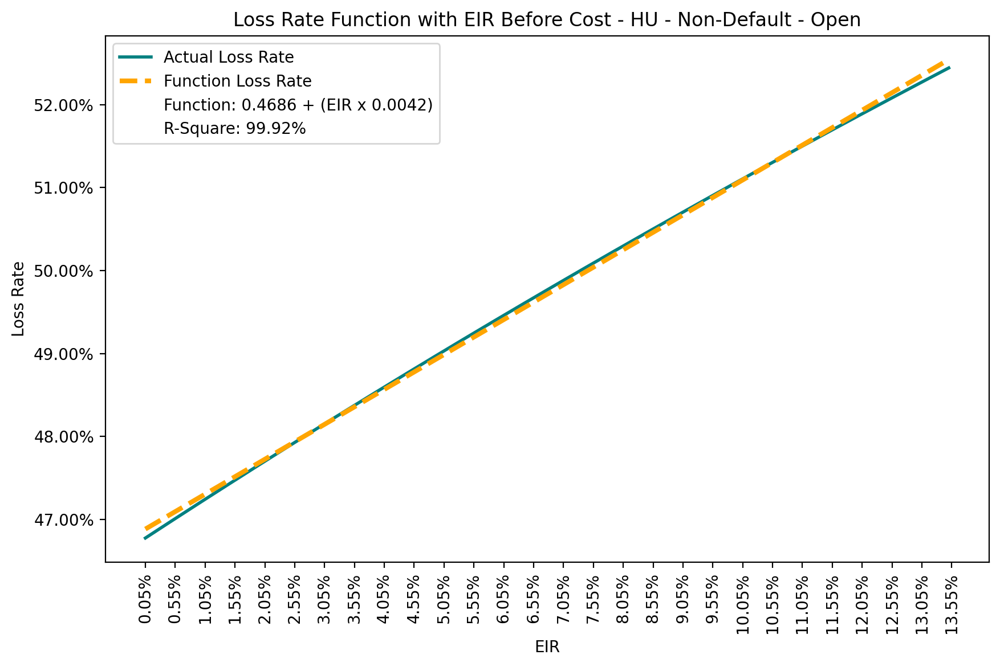

In [ ]:
_# Plot LGD Function
for segment in DRR['SEGMENT'].unique():
  for default in DRR['DEFAULT_FLAG'].unique():
    for pool in DRR['DEFAULT_POOL'].unique():
      # Call function
      name = f'{segment}_{default}_{pool}' #Assign function name
      function = FUNCTION[name]
      # Query data for plotting
      dataPlot = DRR.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")
      yActual = dataPlot['LOSS_RATE']
      yPredict = function.predict(
          sm.add_constant(dataPlot['EIR'], has_constant = 'add')
      )
      # Plot
      plt.figure(figsize = (10, 6))
      plt.plot(
          dataPlot['EIR'],
          yActual,
          color = 'teal',
          linewidth = 2,
          label = 'Actual Loss Rate'
      )
      plt.plot(
          dataPlot['EIR'],
          yPredict,
          color = 'orange',
          linewidth = 3,
          linestyle = '--',
          label = 'Function Loss Rate'
      )
      plt.xticks(
          np.arange(
              min(dataPlot['EIR']),
              max(dataPlot['EIR']) + 0.05,
              0.5
          ),
          rotation = 90
      )
      plt.gca().set_xticklabels([f'{x:.2f}%' for x in plt.gca().get_xticks()])
      plt.gca().set_yticklabels([f'{y * 100:.2f}%' for y in plt.gca().get_yticks()])
      plt.plot([], [], ' ', label = f'Function: {function.params[0]:.4f} + (EIR x {function.params[1]:.4f})')
      plt.plot([], [], ' ', label = f'R-Square: {function.rsquared * 100:.2f}%')
      plt.legend(
          frameon = True,
          facecolor = 'white'
      )
      plt.ylabel('Loss Rate')
      plt.xlabel('EIR')
      plt.title(f'Loss Rate Function with EIR Before Cost - {segment} - {default} - {pool}')
      plt.show()

# Direct Cost
The Direct Costs are calculated using historical observed. It is expressed as a percentage of  recovery and discounting with EIR to calculate present value of cost. The cost rate is using the following formula:

\begin{align}
        Cost \ Rate = \frac{Cumulative \ Cost_{t}}{Actual \ Cumulative \ Recovery_{t}}
    \end{align}

The average cost will be appiled to loss rate calculation.

In [ ]:
# Direct cost
# Create long format recovery table
CostSummary = pd.melt(
    CostTable,
    id_vars = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'EIR'],
    var_name = 'MONTH_AFTER_DEFAULT',
    value_name = 'COST'
).sort_values(
    by = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'MONTH_AFTER_DEFAULT']
).reset_index(drop = True) #Sort by observed year

# Convert 'MONTH_AFTER_DEFAULT' to int
CostSummary['MONTH_AFTER_DEFAULT'] = CostSummary['MONTH_AFTER_DEFAULT'].astype(int)

# Discount cost with EIR
CostSummary['PV_COST'] = CostSummary['COST'] / (1 + CostSummary['EIR'] / 100 / 12) ** CostSummary['MONTH_AFTER_DEFAULT']

# Cumulative cost
CostSummary['CUMULATIVE_COST'] = CostSummary.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR']
)['PV_COST'].cumsum()

# Show table
CostSummary.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,EIR,MONTH_AFTER_DEFAULT,COST,PV_COST,CUMULATIVE_COST
0,CU,Existing-Default,Closed,2014,7.062609,0,0.000000,0.000000,0.000000
1,CU,Existing-Default,Closed,2014,7.062609,1,100255.226562,99668.626151,99668.626151
2,CU,Existing-Default,Closed,2014,7.062609,2,52892.175781,52275.034834,151943.660986
3,CU,Existing-Default,Closed,2014,7.062609,3,42296.453125,41558.350110,193502.011096
4,CU,Existing-Default,Closed,2014,7.062609,4,41949.167969,40975.961014,234477.972110


In [ ]:
# Mapping PV of recovery
CostSummary = pd.merge(
    CostSummary.query("MONTH_AFTER_DEFAULT > 0"), #Selecting month after default only
    RecoverySummary.drop(
        ['OUTSTANDING'],
        axis = 1
    ),
    how = 'left',
    left_on = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'MONTH_AFTER_DEFAULT'],
    right_on = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR', 'MONTH_AFTER_DEFAULT']
)

# Discount recovery with EIR
CostSummary['PV_RECOVERY'] = CostSummary['RECOVERY'] / (1 + CostSummary['EIR'] / 100 / 12) ** CostSummary['MONTH_AFTER_DEFAULT']

# Cumulative recovery
CostSummary['CUMULATIVE_RECOVERY'] = CostSummary.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR']
)['PV_RECOVERY'].cumsum()

# Cost rate
CostSummary['COST_RATE'] = CostSummary['CUMULATIVE_COST'] / CostSummary['CUMULATIVE_RECOVERY']

# Show table
CostSummary.head(5)

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,YEAR,EIR,MONTH_AFTER_DEFAULT,COST,PV_COST,CUMULATIVE_COST,RECOVERY,PV_RECOVERY,CUMULATIVE_RECOVERY,COST_RATE
0,CU,Existing-Default,Closed,2014,7.062609,1,100255.226562,99668.626151,99668.626151,1.571470e+06,1.562275e+06,1.562275e+06,0.063797
1,CU,Existing-Default,Closed,2014,7.062609,2,52892.175781,52275.034834,151943.660986,7.779942e+05,7.689166e+05,2.331192e+06,0.065179
2,CU,Existing-Default,Closed,2014,7.062609,3,42296.453125,41558.350110,193502.011096,6.767740e+05,6.649638e+05,2.996156e+06,0.064583
3,CU,Existing-Default,Closed,2014,7.062609,4,41949.167969,40975.961014,234477.972110,6.680010e+05,6.525036e+05,3.648659e+06,0.064264
4,CU,Existing-Default,Closed,2014,7.062609,5,38493.597656,37380.555276,271858.527386,5.783901e+05,5.616659e+05,4.210325e+06,0.064569


In [ ]:
# Summary cost rate
pd.pivot_table(
    CostSummary.groupby(
        ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'YEAR'],
        as_index = False
    )['COST_RATE'].mean(),
    values = 'COST_RATE',
    index = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL'],
    columns = ['YEAR']
).reset_index()

YEAR,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,2014,2015,2016,2017,2018,2019
0,CU,Existing-Default,Closed,0.064441,0.063644,0.062609,0.063931,0.063085,0.065439
1,CU,Existing-Default,Open,0.065774,0.063637,0.062708,0.063114,0.063858,0.064425
2,CU,Non-Default,Closed,0.063313,0.060317,0.063284,0.065635,0.063912,NaN
3,CU,Non-Default,Open,0.063998,0.064093,0.063899,0.063880,0.064734,NaN
4,HU,Existing-Default,Closed,0.058825,0.063150,0.062709,0.062013,0.063533,0.063905
5,HU,Existing-Default,Open,0.064029,0.064046,0.064653,0.064155,0.063682,0.063810
6,HU,Non-Default,Closed,0.063685,0.063894,0.062981,0.063285,0.063818,NaN
7,HU,Non-Default,Open,0.063916,0.063870,0.064162,0.063953,0.063635,NaN


In [ ]:
# Cost selection
'''
It can be seen that the cost(s) are range between 6.3% - 6.5%.
Thus, the average of observed years will be used as direct cost.
'''

DirectCost = CostSummary.groupby(
    ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL',],
    as_index = False
)['COST_RATE'].mean()

DirectCost

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,COST_RATE
0,CU,Existing-Default,Closed,0.063742
1,CU,Existing-Default,Open,0.064061
2,CU,Non-Default,Closed,0.062962
3,CU,Non-Default,Open,0.064055
4,HU,Existing-Default,Closed,0.061740
5,HU,Existing-Default,Open,0.064130
6,HU,Non-Default,Closed,0.063550
7,HU,Non-Default,Open,0.063932


 # EIR Linkage Function After Direct Cost
 The cost will be incorporated into the loss rate function as per below:

\begin{align}
        \text{Loss Rate (After Cost)} \ = \text{Loss Rate (Before Cost) + [Cost Rate x 1 - (Loss Rate (Before Cost))]}
    \end{align}

In [ ]:
# LGD Function cost adjustment
FUNCTION_AFTER = copy.deepcopy(FUNCTION) #Deep copy to remain original function

for segment in DirectCost['SEGMENT'].unique():
  for default in DirectCost['DEFAULT_FLAG'].unique():
    for pool in DirectCost['DEFAULT_POOL'].unique():
      costData = float(DirectCost.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")['COST_RATE']) #Cost rate
      name = f'{segment}_{default}_{pool}' #Assign function name
      print(f'Cost: {name} = {costData * 100:.2f}%')
      # Call function for adjustment
      function = FUNCTION_AFTER[name]
      print(f'Before cost: ({function.params[0]:.4f} + EIR x {function.params[1]:.4f})')
      print(f'Adjust cost: ({function.params[0]:.4f} + EIR x {function.params[1]:.4f}) + {costData:.4f} x [1 - ({function.params[0]:.4f} + EIR x {function.params[1]:.4f})]')
      # Adjust with direct cost
      function.params[0] = function.params[0] + costData + (-costData * function.params[0])
      function.params[1] = function.params[1] + (-costData * function.params[1])
      print(f'After  cost: ({function.params[0]:.4f} + EIR x {function.params[1]:.4f})')
      print('==============================================================================')

Cost: CU_Existing-Default_Closed = 6.37%
Before cost: (0.7358 + EIR x 0.0031)
Adjust cost: (0.7358 + EIR x 0.0031) + 0.0637 x [1 - (0.7358 + EIR x 0.0031)]
After  cost: (0.7526 + EIR x 0.0029)
Cost: CU_Existing-Default_Open = 6.41%
Before cost: (0.9476 + EIR x 0.0005)
Adjust cost: (0.9476 + EIR x 0.0005) + 0.0641 x [1 - (0.9476 + EIR x 0.0005)]
After  cost: (0.9510 + EIR x 0.0004)
Cost: CU_Non-Default_Closed = 6.30%
Before cost: (0.2118 + EIR x 0.0073)
Adjust cost: (0.2118 + EIR x 0.0073) + 0.0630 x [1 - (0.2118 + EIR x 0.0073)]
After  cost: (0.2615 + EIR x 0.0069)
Cost: CU_Non-Default_Open = 6.41%
Before cost: (0.4733 + EIR x 0.0038)
Adjust cost: (0.4733 + EIR x 0.0038) + 0.0641 x [1 - (0.4733 + EIR x 0.0038)]
After  cost: (0.5071 + EIR x 0.0036)
Cost: HU_Existing-Default_Closed = 6.17%
Before cost: (0.6906 + EIR x 0.0034)
Adjust cost: (0.6906 + EIR x 0.0034) + 0.0617 x [1 - (0.6906 + EIR x 0.0034)]
After  cost: (0.7097 + EIR x 0.0031)
Cost: HU_Existing-Default_Open = 6.41%
Before cos

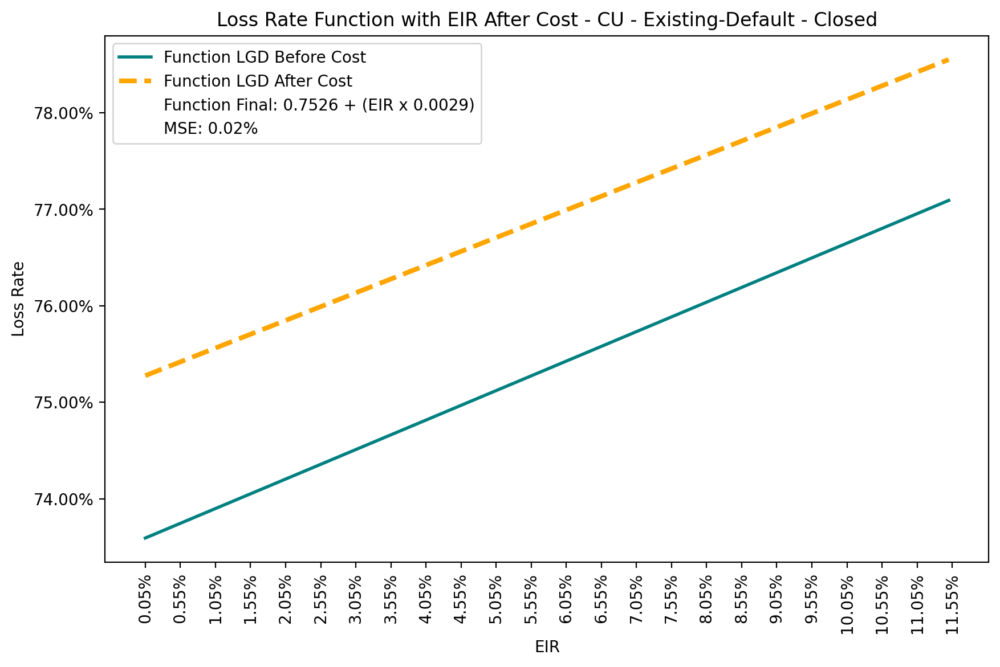

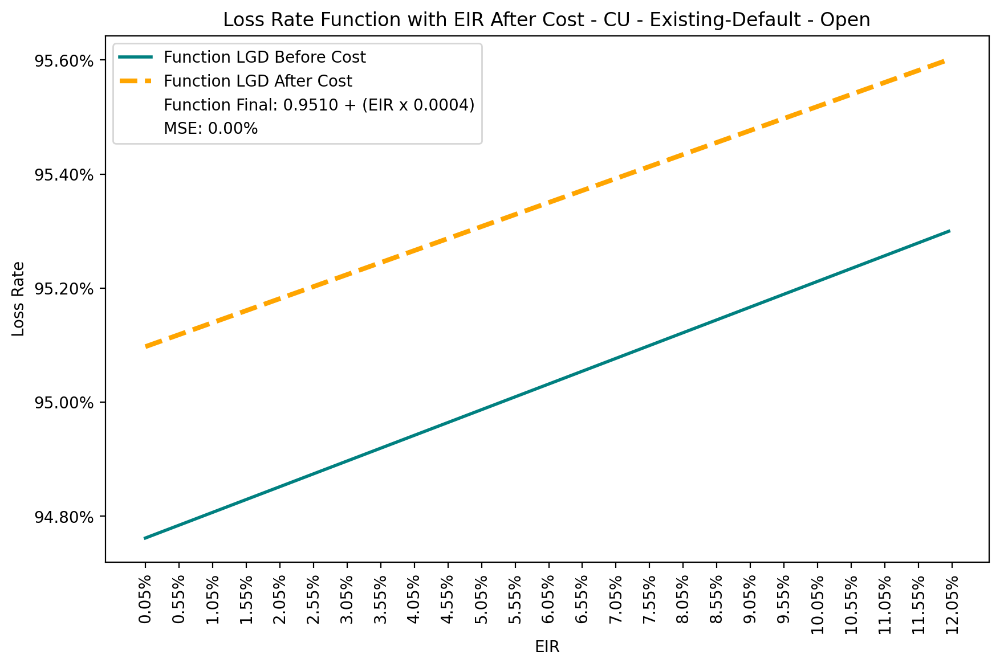

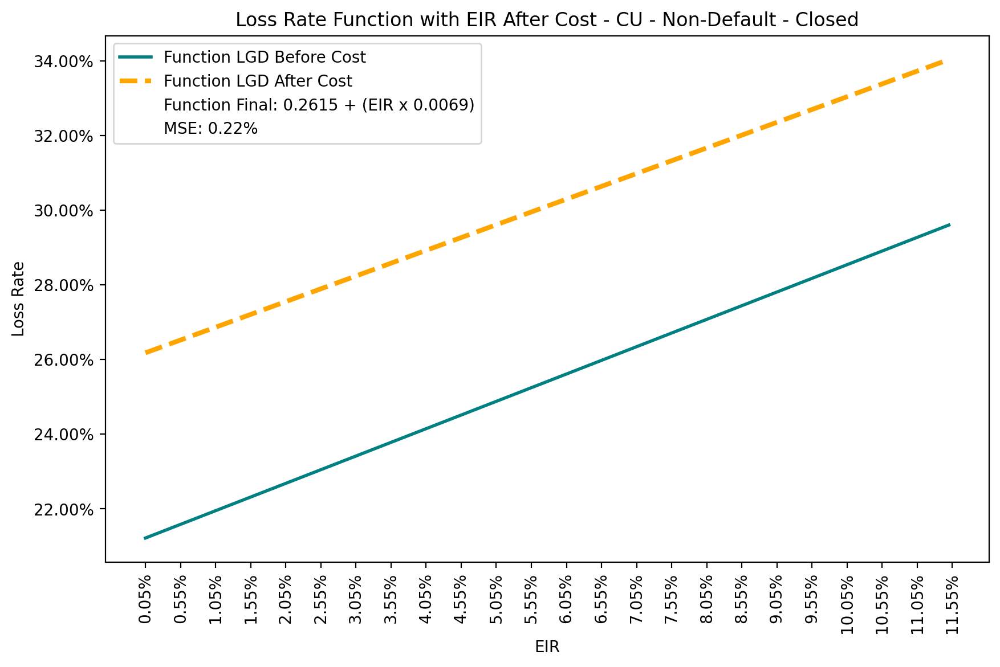

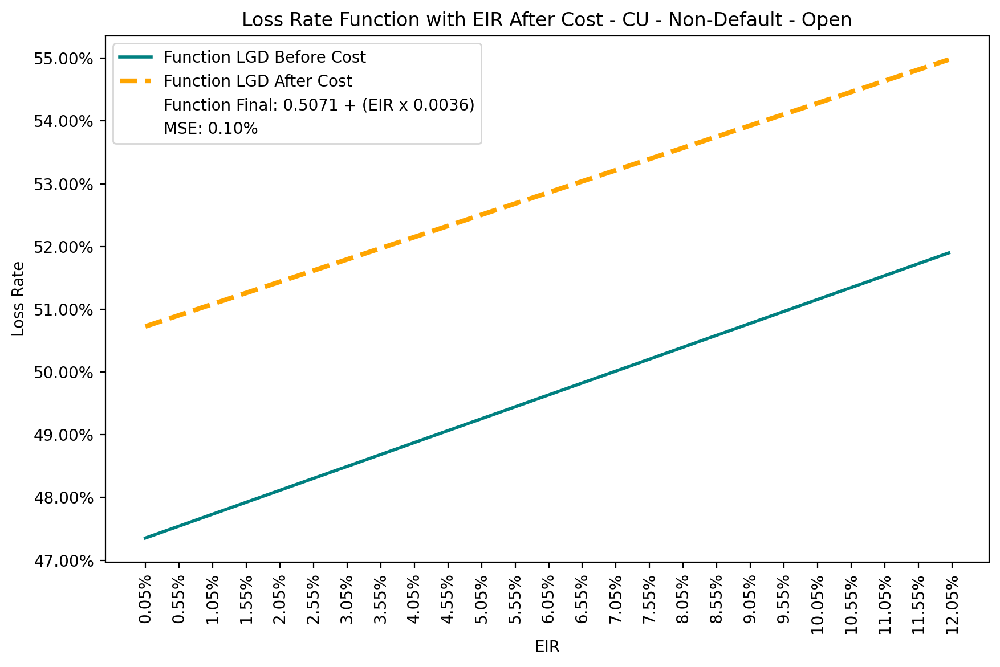

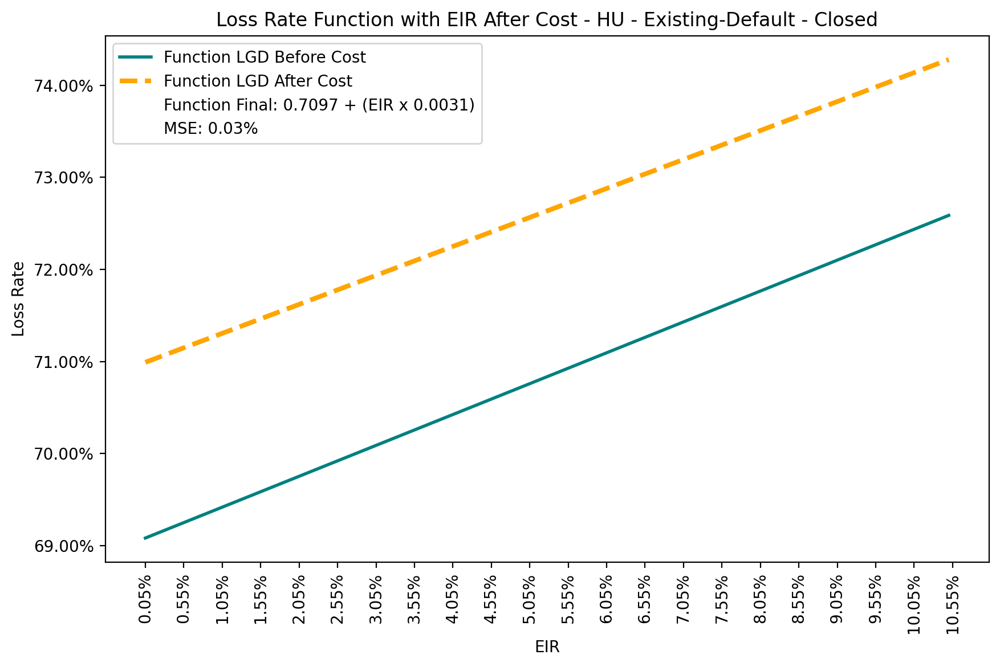

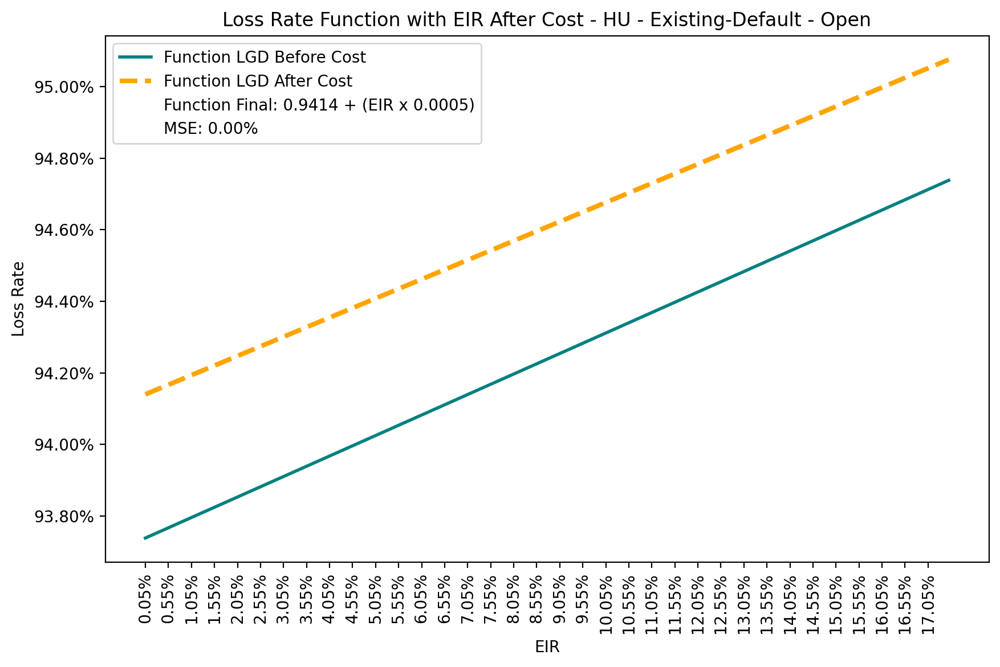

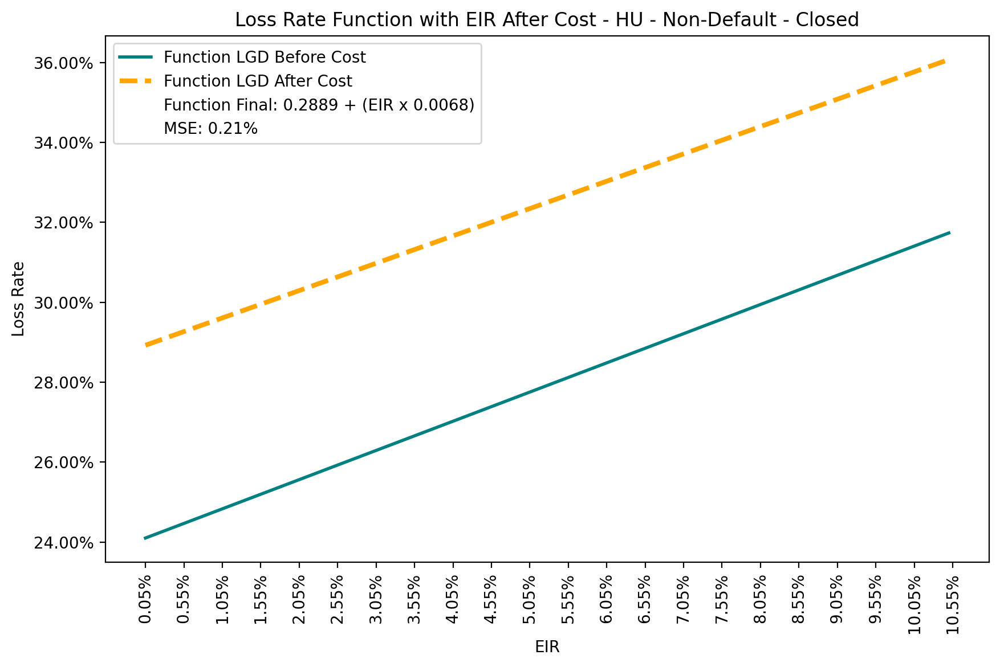

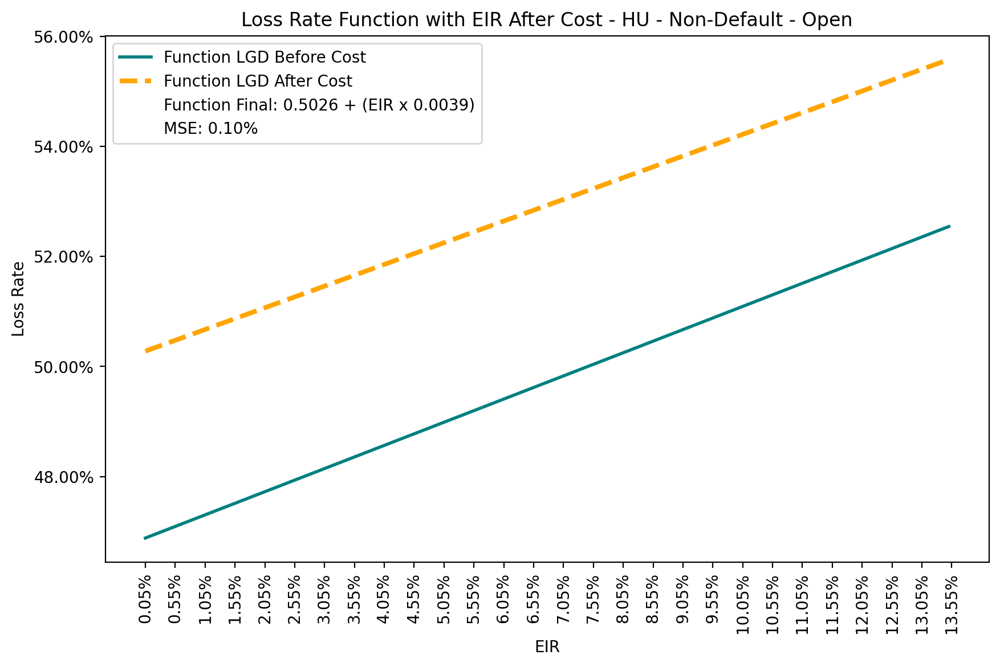

In [ ]:
# Back-testing
for segment in DRR['SEGMENT'].unique():
  for default in DRR['DEFAULT_FLAG'].unique():
    for pool in DRR['DEFAULT_POOL'].unique():
      # Call function
      name = f'{segment}_{default}_{pool}' #Assign function name
      functionBefore = FUNCTION[name]
      functionAfter = FUNCTION_AFTER[name]
      # Query data for plotting
      dataPlot = DRR.query("SEGMENT == @segment and DEFAULT_FLAG == @default and DEFAULT_POOL == @pool")
      yBefore = functionBefore.predict(
          sm.add_constant(dataPlot['EIR'], has_constant = 'add')
      )
      yAfter = functionAfter.predict(
          sm.add_constant(dataPlot['EIR'], has_constant = 'add')
      )
      # Plot
      plt.figure(figsize = (10, 6))
      plt.plot(
          dataPlot['EIR'],
          yBefore,
          color = 'teal',
          linewidth = 2,
          label = 'Function LGD Before Cost'
      )
      plt.plot(
          dataPlot['EIR'],
          yAfter,
          color = 'orange',
          linewidth = 3,
          linestyle = '--',
          label = 'Function LGD After Cost'
      )
      plt.xticks(
          np.arange(
              min(dataPlot['EIR']),
              max(dataPlot['EIR']) + 0.05,
              0.5
          ),
          rotation = 90
      )
      plt.gca().set_xticklabels([f'{x:.2f}%' for x in plt.gca().get_xticks()])
      plt.gca().set_yticklabels([f'{y * 100:.2f}%' for y in plt.gca().get_yticks()])
      plt.plot([], [], ' ', label = f'Function Final: {functionAfter.params[0]:.4f} + (EIR x {functionAfter.params[1]:.4f})')
      plt.plot([], [], ' ', label = f'MSE: {mean_squared_error(yBefore, yAfter) * 100:.2f}%')
      plt.legend(
          frameon = True,
          facecolor = 'white'
      )
      plt.ylabel('Loss Rate')
      plt.xlabel('EIR')
      plt.title(f'Loss Rate Function with EIR After Cost - {segment} - {default} - {pool}')
      plt.show()

In [ ]:
# LGD Parameters
LGDFunctionSummary = []

for segment in DirectCost['SEGMENT'].unique():
  for default in DirectCost['DEFAULT_FLAG'].unique():
    for pool in DirectCost['DEFAULT_POOL'].unique():
      name = f'{segment}_{default}_{pool}' #Assign function name
      # Call function for adjustment
      function = FUNCTION_AFTER[name]
      LGDFunctionSummary.append(
          [
              segment,
              default,
              pool,
              f'{function.params[0]:.4f} + EIR x {function.params[1]:.4f}'
          ]
      )

LGDFunctionSummary = pd.DataFrame(
    LGDFunctionSummary,
    columns = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'LOSS_RATE = f(EIR)']
)

# Summay LGD Model
LGDSummary = pd.merge(
    FlowRateSummary[['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'FLOW_RATE']],
    LGDFunctionSummary[['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL', 'LOSS_RATE = f(EIR)']],
    how = 'left',
    left_on = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL'],
    right_on = ['SEGMENT', 'DEFAULT_FLAG', 'DEFAULT_POOL']
)

# Show table
LGDSummary

,SEGMENT,DEFAULT_FLAG,DEFAULT_POOL,FLOW_RATE,LOSS_RATE = f(EIR)
0,CU,Existing-Default,Closed,0.068342,0.7526 + EIR x 0.0029
1,CU,Existing-Default,Open,0.931658,0.9510 + EIR x 0.0004
2,CU,Non-Default,Closed,0.142036,0.2615 + EIR x 0.0069
3,CU,Non-Default,Open,0.857964,0.5071 + EIR x 0.0036
4,HU,Existing-Default,Closed,0.074078,0.7097 + EIR x 0.0031
5,HU,Existing-Default,Open,0.925922,0.9414 + EIR x 0.0005
6,HU,Non-Default,Closed,0.192578,0.2889 + EIR x 0.0068
7,HU,Non-Default,Open,0.807422,0.5026 + EIR x 0.0039
